<a href="https://colab.research.google.com/github/descartesmbogning/Keyword-Extraction-using-TF-IDF-for-Bigrams/blob/main/patent_Keyword_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install nltk matplotlib wordcloud scikit-learn


In [2]:
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from collections import Counter
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [3]:
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Downloads
nltk.download('wordnet')
nltk.download('stopwords')

# Initialize your stopwords set with wordcloud's stopwords
s = set(STOPWORDS)

# Get stopwords for all languages in NLTK
languages = stopwords.fileids()
for language in languages:
    s.update(stopwords.words(language))

# Add any additional stopwords if needed
s.add('amp')

# If you really need the resulting stopwords as a list:
stopwords_list = list(s)


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [4]:
# Load your dataset (Assuming it's a CSV with a column 'abstract' for patent abstracts)

# import data


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
data_all = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
#data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_patent_therapy_23102023_10.pkl').reset_index()
pd.set_option('display.max_columns', None)
print(len(data_all))
data_all.head()

2365


,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED


In [7]:
#data_topic = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
data_topic = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_patent_therapy_23102023_10.pkl').reset_index()[[
    'Lens ID','Topic N°'
]]
pd.set_option('display.max_columns', None)
print(len(data_topic))
data_topic.head()

2309


,Lens ID,Topic N°
0,069-390-611-717-343,2
1,114-759-028-882-736,3
2,094-982-928-461-863,3
3,112-018-476-081-94X,3
4,091-234-230-295-135,3


In [8]:
# Merge the DataFrames on 'common_column'
data = data_all.merge(data_topic, on='Lens ID', how='outer')
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,2.0
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,3.0
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,3.0
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2360,2361,GB,A,GB 1165745 A,150-422-589-010-681,1969-10-01,1969,GB 3886866 A,1966-08-31,US 48872465 A,1965-09-20,Novel Dinucleoside Phosphates,"1,165,745. Dinucleoside phosphates. UPJOHN CO....",UPJOHN CO,NaN,NaN,https://lens.org/150-422-589-010-681,Granted Patent,no,0,0,7,7,0,C07H19/14;;C07H19/14;;Y02P20/55;;Y02P20/55;;Y1...,C07H19/14,C2A A1B -;;C2A A1C2C -;;C2A ...,0,0,NaN,NaN,NaN,EXPIRED,0.0
2361,2362,GB,A,GB 1165354 A,058-819-734-343-222,1969-09-24,1969,GB 3887066 A,1966-08-31,US 48879965 A,1965-09-20,Novel Dinucleoside Phosphates,"1,165,354. Dinucleoside phosphates. UPJOHN CO....",UPJOHN CO,NaN,NaN,https://lens.org/058-819-734-343-222,Granted Patent,no,0,0,7,7,0,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C2A A1B -;;C2A A1C2C -;

# data preprocessing

## clean year and group year in ranges periods

In [9]:
data['Application Date'] = pd.to_datetime(data['Application Date'])
data['Earliest Priority Date'] = pd.to_datetime(data['Earliest Priority Date'])

In [10]:
data['Application Year'] = data['Application Date'].dt.year
data['Earliest Priority Year'] = data['Earliest Priority Date'].dt.year

In [11]:
# Convert 'Publication Year' to integers
data['Publication Year'] = data['Publication Year'].astype('Int64')
data['Application Year'] = data['Application Year'].astype('Int64')
data['Earliest Priority Year'] = data['Earliest Priority Year'].astype('Int64')

In [12]:
def group_years_in_ranges(df, col_name):
    bins = list(range(1950, 2026, 5))
    labels = [f"{i}-{i+4}" for i in bins[:-1]]
    return pd.cut(data['Application Year'], bins=bins, labels=labels, right=False)


In [13]:
data['Application_Year_Range'] = group_years_in_ranges(data, 'Application Year')


## clean IPCR Classifications

In [14]:
data['IPCR Classifications']

0                                    A61K35/76;;A61P31/06
1               C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09
2                         A61K35/76;;C12N9/14;;G01N33/569
3                           A61K35/76;;A61K9/00;;C12N7/00
4                                     A61K35/76;;C12N7/00
                              ...                        
2360                                            C07H19/14
2361    C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...
2362                                             C12Q1/68
2363     A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00
2364    A61K39/00;;A61K39/29;;A61K39/295;;A61K39/385;;...
Name: IPCR Classifications, Length: 2365, dtype: object

In [15]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_sections(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[0] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Sections'] = data['IPCR Classifications'].apply(process_ipcr_sections)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Sections']]


,IPCR Classifications,IPCR Sections
0,A61K35/76;;A61P31/06,A
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A;;C
2,A61K35/76;;C12N9/14;;G01N33/569,A;;C;;G
3,A61K35/76;;A61K9/00;;C12N7/00,A;;C
4,A61K35/76;;C12N7/00,A;;C
...,...,...
2360,C07H19/14,C
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C
2362,C12Q1/68,C
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A;;C


In [16]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_class(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[:3] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Class'] = data['IPCR Classifications'].apply(process_ipcr_class)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Class']]


,IPCR Classifications,IPCR Class
0,A61K35/76;;A61P31/06,A61
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A61;;C12
2,A61K35/76;;C12N9/14;;G01N33/569,A61;;C12;;G01
3,A61K35/76;;A61K9/00;;C12N7/00,A61;;C12
4,A61K35/76;;C12N7/00,A61;;C12
...,...,...
2360,C07H19/14,C07
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C07;;C08;;C12
2362,C12Q1/68,C12
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A21;;A23;;C12


In [17]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_subclass(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[:4] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Subclass'] = data['IPCR Classifications'].apply(process_ipcr_subclass)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Subclass']]


,IPCR Classifications,IPCR Subclass
0,A61K35/76;;A61P31/06,A61K;;A61P
1,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,A61K;;A61P;;C12N
2,A61K35/76;;C12N9/14;;G01N33/569,A61K;;C12N;;G01N
3,A61K35/76;;A61K9/00;;C12N7/00,A61K;;C12N
4,A61K35/76;;C12N7/00,A61K;;C12N
...,...,...
2360,C07H19/14,C07H
2361,C07H19/04;;C07H19/044;;C07H19/207;;C08F2/00;;C...,C07H;;C08F;;C12P
2362,C12Q1/68,C12Q
2363,A21D2/00;;A23C9/12;;C12N1/00;;C12N1/12;;C12P1/00,A21D;;A23C;;C12N;;C12P


## preprocesse jurisdiction: add the full name and add a columns for region

In [18]:
data['Jurisdiction'].unique()

array(['RU', 'JP', 'AU', 'US', 'CN', 'CA', 'WO', 'EP', 'SG', 'KR', 'NZ',
       'GB', 'GE', 'DE', 'CZ', 'MX', 'TN', 'ES', 'IN', 'EA', 'TW', 'UA',
       'MY', 'SU', 'FR', 'CH', 'PH', 'SK', 'NL', 'LV', 'ZA', 'PL', 'BG'],
      dtype=object)

In [19]:
import pandas as pd

# Assuming `data` is your DataFrame and has a column named 'Jurisdiction'

jurisdiction_codes = {
    'RU': 'Russia',
    'JP': 'Japan',
    'AU': 'Australia',
    'US': 'United States',
    'CN': 'China',
    'CA': 'Canada',
    'WO': 'World Intellectual Property Organization',
    'EP': 'European Patent Office',
    'SG': 'Singapore',
    'KR': 'South Korea',
    'NZ': 'New Zealand',
    'GB': 'United Kingdom (Great Britain)',
    'GE': 'Georgia',  # or 'Germany' for historical East Germany
    'DE': 'Germany',
    'CZ': 'Czech Republic',
    'MX': 'Mexico',
    'TN': 'Tunisia',
    'ES': 'Spain',
    'IN': 'India',
    'EA': 'Eurasian Patent Organization',
    'TW': 'Taiwan',
    'UA': 'Ukraine',
    'MY': 'Malaysia',
    'SU': 'Soviet Union (historical)',
    'FR': 'France',
    'CH': 'Switzerland',
    'PH': 'Philippines',
    'SK': 'Slovakia',
    'NL': 'Netherlands',
    'LV': 'Latvia',
    'ZA': 'South Africa',
    'PL': 'Poland',
    'BG': 'Bulgaria',
}

# Replace the codes with names in the 'Jurisdiction' column
data['Jurisdiction_name'] = data['Jurisdiction'].map(jurisdiction_codes).fillna(data['Jurisdiction'])

#data[['Jurisdiction', 'Jurisdiction_name']]

In [20]:
import pandas as pd

# Your existing DataFrame is 'data', and it contains a column 'Jurisdiction'

# Map of jurisdiction codes to their respective continent or region names
jurisdiction_to_region = {
    # Western Europe
    'GB': 'Western Europe', 'DE': 'Western Europe', 'FR': 'Western Europe',
    'CH': 'Western Europe', 'NL': 'Western Europe', 'ES': 'Western Europe',

    # Eastern Europe
    'RU': 'Eastern Europe', 'CZ': 'Eastern Europe', 'UA': 'Eastern Europe',
    'SK': 'Eastern Europe', 'LV': 'Eastern Europe', 'PL': 'Eastern Europe',
    'GE': 'Eastern Europe', 'BG': 'Eastern Europe',

    # Rest of the regions
    'JP': 'Asia', 'AU': 'Oceania', 'US': 'North America', 'CN': 'Asia',
    'CA': 'North America', 'WO': 'International', 'EP': 'Europe', 'SG': 'Asia',
    'KR': 'Asia', 'NZ': 'Oceania', 'MX': 'North America', 'TN': 'Africa',
    'IN': 'Asia', 'EA': 'Eurasia', 'TW': 'Asia', 'MY': 'Asia',
    'SU': 'Eurasia', 'PH': 'Asia', 'ZA': 'Africa'
}

# Create a new column 'Region' by mapping the 'Jurisdiction' column using the dictionary
data['Jurisdiction_Region'] = data['Jurisdiction'].map(jurisdiction_to_region).fillna(data['Jurisdiction'])

data[['Jurisdiction', 'Jurisdiction_name', 'Jurisdiction_Region']]


,Jurisdiction,Jurisdiction_name,Jurisdiction_Region
0,RU,Russia,Eastern Europe
1,JP,Japan,Asia
2,AU,Australia,Oceania
3,US,United States,North America
4,AU,Australia,Oceania
...,...,...,...
2360,GB,United Kingdom (Great Britain),Western Europe
2361,GB,United Kingdom (Great Britain),Western Europe
2362,SG,Singapore,Asia
2363,SG,Singapore,Asia


In [21]:
data['Jurisdiction_name'].unique()

array(['Russia', 'Japan', 'Australia', 'United States', 'China', 'Canada',
       'World Intellectual Property Organization',
       'European Patent Office', 'Singapore', 'South Korea',
       'New Zealand', 'United Kingdom (Great Britain)', 'Georgia',
       'Germany', 'Czech Republic', 'Mexico', 'Tunisia', 'Spain', 'India',
       'Eurasian Patent Organization', 'Taiwan', 'Ukraine', 'Malaysia',
       'Soviet Union (historical)', 'France', 'Switzerland',
       'Philippines', 'Slovakia', 'Netherlands', 'Latvia', 'South Africa',
       'Poland', 'Bulgaria'], dtype=object)

In [22]:
data['Jurisdiction_Region'].unique()

array(['Eastern Europe', 'Asia', 'Oceania', 'North America',
       'International', 'Europe', 'Western Europe', 'Africa', 'Eurasia'],
      dtype=object)

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2365 entries, 0 to 2364
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   #                            2365 non-null   int64         
 1   Jurisdiction                 2365 non-null   object        
 2   Kind                         2365 non-null   object        
 3   Display Key                  2365 non-null   object        
 4   Lens ID                      2365 non-null   object        
 5   Publication Date             2365 non-null   object        
 6   Publication Year             2365 non-null   Int64         
 7   Application Number           2365 non-null   object        
 8   Application Date             2365 non-null   datetime64[ns]
 9   Priority Numbers             2363 non-null   object        
 10  Earliest Priority Date       2363 non-null   datetime64[ns]
 11  Title                        2365 non-null 

In [24]:
#

## add_metrics_to_dataframe: number of Applicants, Inventors and IPCR



```
In this function, add_metrics_to_dataframe:

    It takes your DataFrame and the name of the column containing the entity data (entity_column).
    A nested function, count_unique_entities, splits the entities in each row, counts the unique entities, and returns this count.
    This nested function is then applied to each row in the entity_column, creating a new column in the DataFrame named 'Number of Unique Entities'.
    You can extend this function to calculate more metrics in a similar manner and add them as new columns.
```



In [25]:
import pandas as pd
import numpy as np

def add_metrics_to_dataframe(dataframe, entity_column):
    # Function to calculate the number of unique entities in a given row
    def count_unique_entities(entities_string):
        if isinstance(entities_string, str):
            entities = entities_string.split(';;')
            unique_entities = set(entities)
            return len(unique_entities)
        else:
            # Return NaN for non-string data (like NaN or float)
            return np.nan

    # Apply the function to each row in the entity_column
    dataframe[f'Number of Unique {entity_column}'] = dataframe[entity_column].apply(count_unique_entities)

    # Additional metrics can be calculated and added in a similar manner
    # For example, you can add more functions here to calculate other metrics

    return dataframe



In [26]:
# Call the function to add metrics to the DataFrame
updated_dataframe = add_metrics_to_dataframe(data, 'Applicants')
updated_dataframe = add_metrics_to_dataframe(data, 'Inventors')
updated_dataframe = add_metrics_to_dataframe(data, 'IPCR Sections')
updated_dataframe = add_metrics_to_dataframe(data, 'IPCR Class')
updated_dataframe = add_metrics_to_dataframe(data, 'IPCR Subclass')
updated_dataframe = add_metrics_to_dataframe(data, 'IPCR Classifications')
updated_dataframe


,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,2.0,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Eastern Europe,2.0,3.0,1,1,2,2.0
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,3.0,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,3.0,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED,3.0,2017,2011,2015-2019,A;;C,A61;;C12,A61K;;C12N,Australia,Oceania,2.0,5.0,2,2,2,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [27]:
data['Application_Year_Range'].unique().to_list()

['2000-2004',
 '2015-2019',
 '2020-2024',
 '1995-1999',
 '2010-2014',
 '2005-2009',
 '1990-1994',
 '1955-1959',
 '1980-1984',
 '1970-1974',
 '1985-1989',
 '1975-1979',
 '1965-1969',
 '1960-1964']

# Technological Landscape:

    Objective: Map out the current technological landscape of phage therapy.
        Research Question: What are the most predominant technologies or methods patented in the field of phage therapy over the past decade?

# Keyword Analysis:


1.  Extract Keywords: From titles, and abstracts, extract common keywords. This can be done using simple frequency counts or more complex NLP techniques.
2.   Rank Keywords: Rank the extracted keywords based on frequency. The Top-ranked keywords will often correspond to the predominant technologies or methods.



## clean_data_for_tfidf

In [28]:
import pandas as pd
import re
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

# Download stopwords for all languages
nltk.download('stopwords')

def get_all_stopwords():
    """
    Function to get stopwords from all languages available in NLTK.
    """
    all_stopwords = set()
    for language in stopwords.fileids():
        all_stopwords.update(stopwords.words(language))
    return all_stopwords

all_stopwords = get_all_stopwords()

def clean_text(text):
    """
    Function to clean text data.
    - Lowercases the text
    - Removes special characters and numbers
    - Removes stopwords from all languages
    - Lemmatizes the text
    """
    # Lowercase text
    text = text.lower()
    # Remove punctuation and numbers
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\d+', '', text)
    # Remove stopwords
    text = " ".join([word for word in text.split() if word not in all_stopwords])
    # Lemmatize text
    lemmatizer = WordNetLemmatizer()
    text = " ".join([lemmatizer.lemmatize(word) for word in text.split()])

    return text

def clean_data_for_tfidf(data, columns_to_clean):
    """
    Cleans specified columns in a pandas DataFrame for TF-IDF using all stopwords and
    merges them into a new column.

    Args:
    data (DataFrame): Pandas DataFrame containing the data.
    columns_to_clean (list of str): List of column names in the DataFrame to clean.

    Returns:
    DataFrame: The DataFrame with an additional cleaned column.
    """
    # Check if the columns exist
    for col in columns_to_clean:
        if col not in data.columns:
            raise ValueError(f"Column '{col}' does not exist in DataFrame.")

    # Merge the columns to clean
    data['merged_for_cleaning'] = data[columns_to_clean].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)

    # Clean the merged column
    data['cleaned_merged_column'] = data['merged_for_cleaning'].apply(clean_text)

    # Drop the temporary merged column
    data = data.drop(columns=['merged_for_cleaning'])

    return data


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [29]:
# Columns you want to clean
columns_to_clean = ['Title', 'Abstract']

# Call the function
cleaned_data = clean_data_for_tfidf(data, columns_to_clean)

# Display the cleaned DataFrame
cleaned_data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,cleaned_merged_column
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,2.0,2001,2001,2000-2004,A,A61,A61K;;A61P,Russia,Eastern Europe,2.0,3.0,1,1,2,2.0,method tuberculosis phagotherapy field medicin...
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,3.0,2015,2010,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,Japan,Asia,2.0,5.0,2,2,3,4.0,antibacterial phage phage peptide method there...
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,3.0,2015,2009,2015-2019,A;;C;;G,A61;;C12;;G01,A61K;;C12N;;G01N,Australia,Oceania,2.0,5.0,3,3,3,3.0,antibacterial phage phage peptide method there...
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A61K9/00;;C12N7/00,NaN,0,0,NaN,NaN,NaN,ACTIVE,NaN,2015,2009,2015-2019,A;;C,A61;;C12,A61K;;C12N,United States,North America,2.0,5.0,2,2,2,3.0,antibacterial phage phage peptide method there...
4,5,AU,A1,AU 2017/204331 A1,112-018-476-081-94X,2017-07-13,2017,AU 2017/204331 A,2017-06-26,AU 2017/204331 A;;AU 2015/255313 A;;AU 2011/30...,2011-09-19,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,NaN,https://lens.org/112-018-476-081-94X,Patent Application,no,0,3,1,1,0,Y02A50/30,A61K35/76;;C12N7/00,NaN,0,0,NaN,NaN,NaN,DISCONTINUED,3.0,2017,2011,2015-2019,A;;C,A61;;C12,A61K;;C12N,Austra

## extract_keywords_tfidf

In [30]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

def extract_keywords_tfidf(data, columns, ngram_range=(1, 1), proportion=0.1, exclude_words=[]):
    """
    Extracts keywords from specified columns in a DataFrame using TF-IDF and returns them in a DataFrame
    along with the document count, excluding specified irrelevant words.

    Args:
    data (DataFrame): Pandas DataFrame containing the data.
    columns (list of str): List of column names to analyze.
    ngram_range (tuple): The ngram range for TF-IDF Vectorization (default is (1, 1)).
    proportion (float): Proportion of top keywords to extract (default is 0.1).
    exclude_words (list of str): List of words to exclude from the results.

    Returns:
    DataFrame: A DataFrame with columns 'Rank', 'Term', 'Score', and 'DocCount'.
    """
    # Verify if the columns exist
    for col in columns:
        if col not in data.columns:
            raise ValueError(f"Column '{col}' does not exist in DataFrame.")

    # Merge the columns for analysis
    data['merged_text'] = data[columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)

    # Apply TF-IDF vectorization
    tfidf = TfidfVectorizer(ngram_range=ngram_range)
    tfidf_matrix = tfidf.fit_transform(data['merged_text'])

    # Sum TF-IDF frequency of each term through documents and count document frequency
    sums = tfidf_matrix.sum(axis=0)
    doc_freq = (tfidf_matrix > 0).sum(axis=0)

    # Connecting term to its sums frequency and document frequency
    terms_data = []
    for col, term in enumerate(tfidf.get_feature_names_out()):
        if term not in exclude_words:  # Exclude the irrelevant words
            terms_data.append((term, sums[0, col], doc_freq[0, col]))

    ranking = pd.DataFrame(terms_data, columns=['Term', 'Score', 'DocCount'])
    ranking = ranking.sort_values('Score', ascending=False)

    # Determine the number of top keywords to extract
    top_n = int(len(ranking) * proportion)
    top_keywords = ranking.head(top_n)

    # Add rank column
    top_keywords['Rank'] = range(1, top_n + 1)

    return top_keywords[['Rank', 'Term', 'Score', 'DocCount']]


In [31]:
# Columns to analyze
columns_to_analyze = ['cleaned_merged_column']

# Blacklist of generic and non-useful keywords/bigrams
blacklist = ["prior art",'invention', 'present', "object invention",'disclosed', "disclosed herein", "present invention", "embodiment invention","invention discloses","invention relates",
             "thereof invention","bacteriophage bacteriophage","relates bacteriophage","comprising bacteriophage","bacteriophage present", 'relates','related',
             "invention provides","and or","invention relates","claim wherein","non non","per cent","may used","information related",'wherein',
             "according claim","method claim", "wherein said","least one","according claim","method claim", "wherein said","least one","least 10","sp sp",
             "purpose obtain","problem solved","solved obtain","effective amount","invention also","10 per","least per",'method','also','obtain','solved',
             'present invention relates','application thereof invention','invention relates bacteriophage','application thereof','method thereof','thereof present',
'invention method','comprises step','belongs technical','relates method','invention belongs','provided invention','disclosed invention','comprising present',
'present disclosure','disclosed method','method comprises','provided method','thereof invention discloses','method application thereof','belongs technical field',
'thereof invention relates','thereof present invention','invention relates method','comprising present invention',
'present invention directed','selected group consisting','relates technical field','invention relates composition','utility model discloses',
'method thereof invention','present invention method','invention relates technical','present invention discloses','invention discloses method',
'present invention variously','application thereof belongs','invention variously field','disinfectant cleaning agent','thereof'
             ]  # Add more terms as needed

# data
df = cleaned_data

In [32]:
# N-gram range
ngram_range = (1, 1)  # This will consider both 1-grams (single words) and 2-grams (pairs of words)
# Proportion of top keywords to extract
proportion_of_keywords = 1  # Top 10%

# Calling the function
keywords_df_1 = extract_keywords_tfidf(data=df,
                                     columns=columns_to_analyze,
                                     ngram_range=ngram_range,
                                     proportion=1,
                                     exclude_words=blacklist)
# Display the resulting DataFrame
keywords_df_1


<ipython-input-30-fea5f7541813>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_keywords['Rank'] = range(1, top_n + 1)


,Rank,Term,Score,DocCount
1191,1,bacteriophage,138.015904,1381
673,2,antibody,85.863846,412
8885,3,phage,82.766698,1209
2520,4,composition,82.122704,764
1162,5,bacteria,57.028278,593
...,...,...,...,...
5452,13377,hepadnavirus,0.009708,1
5335,13378,hantaviruses,0.009708,1
12359,13379,truncates,0.009708,1
5255,13380,gsllgrmkga,0.009708,1


In [33]:
# N-gram range
ngram_range = (2, 2)  # This will consider both 1-grams (single words) and 2-grams (pairs of words)
# Proportion of top keywords to extract
proportion_of_keywords = 1  # Top 10%

# Calling the function
keywords_df_2 = extract_keywords_tfidf(data=df,
                                     columns=columns_to_analyze,
                                     ngram_range=ngram_range,
                                     proportion=1,
                                     exclude_words=blacklist)
# Display the resulting DataFrame
keywords_df_2


<ipython-input-30-fea5f7541813>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_keywords['Rank'] = range(1, top_n + 1)


,Rank,Term,Score,DocCount
29031,1,escherichia coli,27.036480,223
60088,2,preventing treating,19.605433,319
3565,3,amino acid,17.975396,286
17395,4,composition comprising,17.849517,273
69838,5,seq id,16.518237,201
...,...,...,...,...
55434,85217,phage animal,0.009303,1
34633,85218,glycoprotein antibody,0.009303,1
34632,85219,glycopeptides carbohydrate,0.009303,1
55250,85220,pertussis haemophilus,0.009303,1


In [34]:
# N-gram range
ngram_range = (3, 3)  # This will consider both 1-grams (single words) and 2-grams (pairs of words)
# Proportion of top keywords to extract
proportion_of_keywords = 1  # Top 10%

# Calling the function
keywords_df_3 = extract_keywords_tfidf(data=df,
                                     columns=columns_to_analyze,
                                     ngram_range=ngram_range,
                                     proportion=1,
                                     exclude_words=blacklist)
# Display the resulting DataFrame
keywords_df_3


<ipython-input-30-fea5f7541813>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_keywords['Rank'] = range(1, top_n + 1)


,Rank,Term,Score,DocCount
5179,1,amino acid sequence,14.366049,249
59863,2,infectious disease caused,9.049051,80
71343,3,method preventing treating,8.863670,105
119226,4,treating infectious disease,7.611825,72
105765,5,shown seq id,7.536466,91
...,...,...,...,...
33240,126384,cytomegalovirus epsteinbarr virus,0.010779,1
92329,126385,prophylactically effective amount,0.010779,1
20584,126386,capsidbinding peptide characterized,0.010779,1
86084,126387,pneumococcal pneumonia yellow,0.010779,1


In [35]:
# N-gram range
ngram_range = (1, 3)  # This will consider both 1-grams (single words) and 2-grams (pairs of words)
# Proportion of top keywords to extract
proportion_of_keywords = 1  # Top 10%

# Calling the function
keywords_df_all = extract_keywords_tfidf(data=df,
                                     columns=columns_to_analyze,
                                     ngram_range=ngram_range,
                                     proportion=1,
                                     exclude_words=blacklist)
# Display the resulting DataFrame
keywords_df_all


<ipython-input-30-fea5f7541813>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_keywords['Rank'] = range(1, top_n + 1)


,Rank,Term,Score,DocCount
22385,1,bacteriophage,67.172737,1381
12251,2,antibody,44.569287,412
146802,3,phage,40.628190,1209
47329,4,composition,38.981918,764
164280,5,protein,27.840244,520
...,...,...,...,...
63213,224986,dimethylaminopropyl carbodiimide hydrochloride,0.005701,1
63212,224987,dimethylaminopropyl carbodiimide,0.005701,1
63211,224988,dimethylaminopropyl,0.005701,1
88395,224989,fusion protein hbv,0.005701,1


## create_wordcloud_from_tfidf

In [36]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def create_wordcloud_from_tfidf(tfidf_result_df, num_keywords):
    """
    Creates a word cloud from a DataFrame of TF-IDF results.

    Args:
    tfidf_result_df (DataFrame): DataFrame containing TF-IDF results with columns 'Term' and 'Score'.
    num_keywords (int): Number of top keywords to include in the word cloud.

    Returns:
    A matplotlib plot of the word cloud.
    """
    # Select the top N keywords
    top_keywords = tfidf_result_df.head(num_keywords)

    # Create a dictionary of word frequencies
    word_frequencies = {row['Term']: row['Score'] for index, row in top_keywords.iterrows()}

    # Generate the word cloud
    wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate_from_frequencies(word_frequencies)

    # Plot the word cloud
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)

    plt.show()

# Example usage:
# Assuming 'keywords_df' is the output DataFrame from the TF-IDF keyword extraction function
# create_wordcloud_from_tfidf(keywords_df, num_keywords=20)


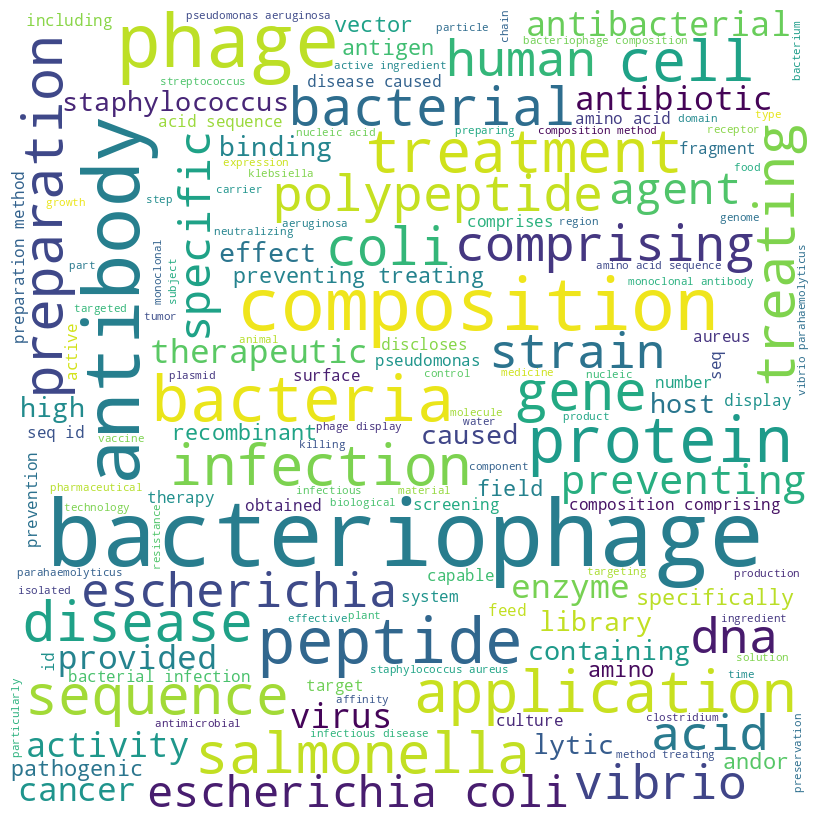

In [37]:
create_wordcloud_from_tfidf(keywords_df_all, num_keywords=2000)

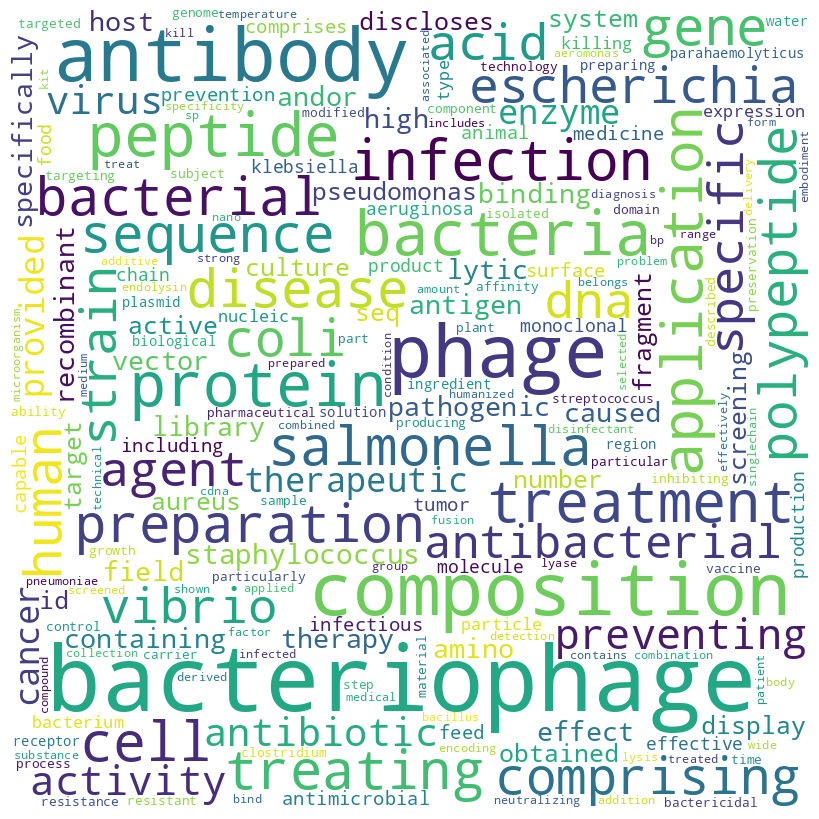

In [38]:
create_wordcloud_from_tfidf(keywords_df_1, num_keywords=2000)

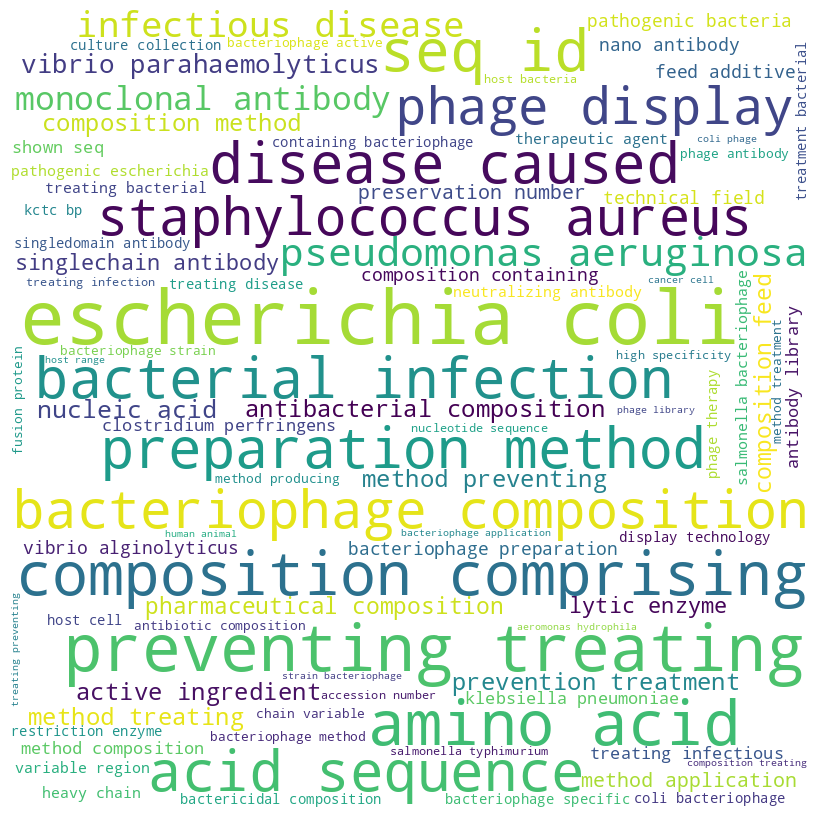

In [39]:
create_wordcloud_from_tfidf(keywords_df_2, num_keywords=2000)

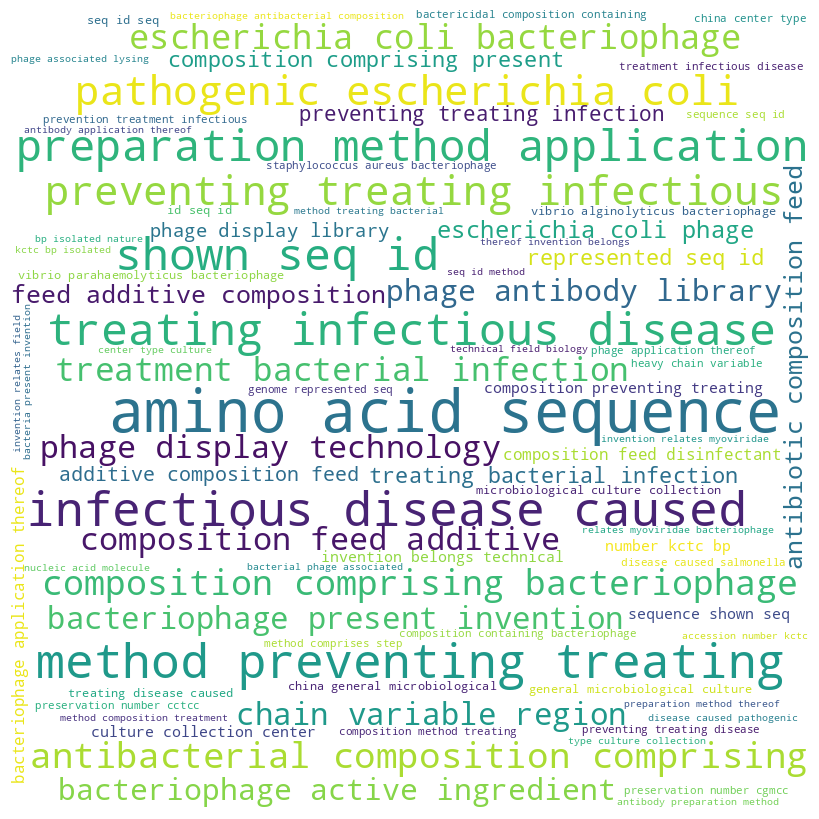

In [40]:
create_wordcloud_from_tfidf(keywords_df_3, num_keywords=2000)

## count_term_occurrences_by_period



```
# Ce texte est au format code
```



In [41]:
import pandas as pd
from collections import Counter
import re

def tokenize(text):
    """
    Tokenizes the input text into words.
    """
    # Remove non-alphanumeric characters and split into words
    words = re.findall(r'\b\w+\b', text.lower())
    return words

def count_all_term_occurrences_by_period(data, text_columns, period_column):
    """
    Counts the occurrences of all terms in patents/documents across different periods.

    Args:
    data (DataFrame): Pandas DataFrame containing the data.
    text_columns (list of str): List of text column names to analyze.
    period_column (str): Column name containing the period.

    Returns:
    dict: A dictionary with periods as keys and DataFrames as values for term occurrences.
    """
    # Verify if the columns exist
    for col in text_columns + [period_column]:
        if col not in data.columns:
            raise ValueError(f"Column '{col}' does not exist in DataFrame.")

    # Group by period column
    grouped_data = data.groupby(period_column)

    # Output dictionary
    period_term_counts = {}

    for period, group in grouped_data:
        # Merge the text columns for analysis and tokenize
        all_text = ' '.join(group[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1))
        all_words = tokenize(all_text)

        # Count occurrences for each term
        term_counts = Counter(all_words)

        # Convert to DataFrame and sort
        term_counts_df = pd.DataFrame.from_dict(term_counts, orient='index', columns=['Count']).sort_values(by='Count', ascending=False)

        # Add to the output dictionary
        period_term_counts[period] = term_counts_df

    return period_term_counts



In [42]:
# Example usage
data = cleaned_data # Your DataFrame
text_columns = ['cleaned_merged_column']  # The text column name
period_column = 'Application Year'  # The period column name

term_occurrences = count_all_term_occurrences_by_period(data, text_columns, period_column)
term_occurrences

{1955:                Count
 milk              14
 bacteriophage     12
 strain            11
 starter           10
 streptococci       9
 ...              ...
 repeated           1
 series             1
 preferred          1
 nonviable          1
 disodium           1
 
 [213 rows x 1 columns],
 1958:                Count
 bacteriophage      5
 hydrolipate        3
 solid              3
 phage              3
 nitrogen           3
 ...              ...
 graphite           1
 coating            1
 enteric            1
 rendered           1
 animal             1
 
 [105 rows x 1 columns],
 1959:             Count
 virus          10
 lipid           6
 system          4
 b               2
 triton          2
 ...           ...
 type            1
 asian           1
 comprising      1
 newcastle       1
 vaccine         1
 
 [66 rows x 1 columns],
 1963:             Count
 culture         8
 vaccine         4
 pig             4
 strain          4
 broth           3
 ...           ...
 eleven



```
Using the results from the count_all_term_occurrences_by_period function involves analyzing the frequency of terms within your dataset across different periods. The output is a dictionary where each key is a period, and the value is a DataFrame containing term counts for that period. Here's how you can use these results:

    Accessing Term Frequencies for Specific Periods:
        To access the term frequencies for a specific period, simply use the period as a key in the dictionary.
```



In [43]:
specific_period = term_occurrences[2020]  # Replace 'specific_period' with the actual period
print(specific_period.head(10))  # Display top terms for that period


               Count
bacteriophage    418
phage            321
invention        261
antibody         227
application      208
method           189
composition      164
thereof          156
treatment        122
protein          121




```
Comparing Term Frequencies Across Periods:

    To compare the frequency of terms across different periods, you can access each period's DataFrame and analyze the changes in term frequency.
```



In [44]:
for period, freq_df in term_occurrences.items():
    print(f"Term frequencies for {period}:")
    print(freq_df.head())  # Adjust number of terms to display as needed


Term frequencies for 1955:
               Count
milk              14
bacteriophage     12
strain            11
starter           10
streptococci       9
Term frequencies for 1958:
               Count
bacteriophage      5
hydrolipate        3
solid              3
phage              3
nitrogen           3
Term frequencies for 1959:
        Count
virus      10
lipid       6
system      4
b           2
triton      2
Term frequencies for 1963:
         Count
culture      8
vaccine      4
pig          4
strain       4
broth        3
Term frequencies for 1964:
             Count
preparation      9
colon            8
citrate          8
acid             8
disodium         8
Term frequencies for 1966:
           Count
yl            48
compound      31
formula       24
group         23
phosphate     18
Term frequencies for 1967:
                  Count
oligonucleotides      3
cyclic                2
preparation           2
contain               2
phosphate             2
Term frequencies for 1968



```
Identifying Trending Terms:

    Look for terms that show a significant increase in frequency across periods. This can indicate trending topics or emerging areas of interest.
    Similarly, terms that decrease in frequency can indicate declining interest or relevance.

Analyzing Term Significance:

    High-frequency terms can indicate key topics or themes for a given period.
    Low-frequency terms might represent niche areas or less emphasized topics.

Visualizing the Data:

    To better understand the trends, consider visualizing the term frequencies using plots (e.g., bar charts, line graphs).
```



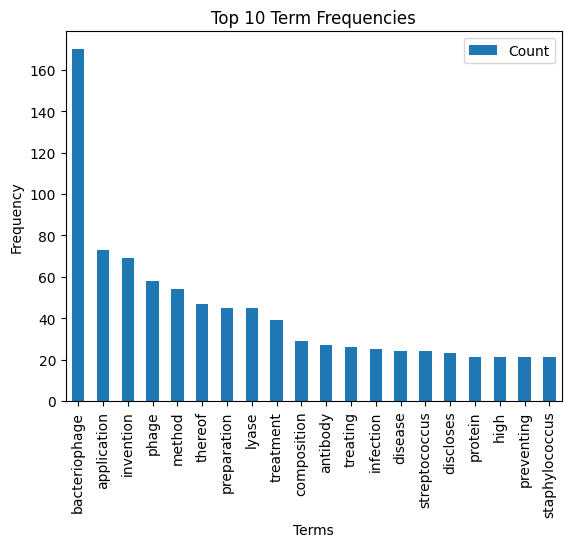

In [45]:
import matplotlib.pyplot as plt

# Example: Plotting term frequencies for a specific period
specific_period = term_occurrences[2023]  # Replace with the actual period
specific_period.head(20).plot(kind='bar')  # Top 10 terms
plt.title("Top 10 Term Frequencies")
plt.xlabel("Terms")
plt.ylabel("Frequency")
plt.show()




```
Contextual Analysis:

    Combine these quantitative findings with qualitative analysis. Understand the context in which these terms are used to gain insights into the underlying reasons for their frequency.

Further Exploration:

    Explore the data to find correlations between terms, or conduct sentiment analysis to gauge the nature of discussions around these terms.
```



### visualize_word_clouds_from_frequencies





```
This function:

    Accepts the term_occurrences dictionary that contains the frequency of terms for each period.
    For each specified period, it generates a word cloud based on the frequency of the top N terms.
    The number of terms to be included in each word cloud can be adjusted using the num_keywords parameter.

To use this function, pass the dictionary returned by the count_all_term_occurrences_by_period function, along with the periods you want to visualize
```



In [46]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def visualize_word_clouds_from_frequencies(term_occurrences, periods_to_visualize, num_keywords=50):
    """
    Generates word cloud visualizations for specified periods from term frequency results.

    Args:
    term_occurrences (dict): Dictionary with term frequency results as returned by the count_all_term_occurrences_by_period function.
    periods_to_visualize (list): List of periods to generate word clouds for.
    num_keywords (int): Number of top keywords to include in the word cloud.

    Returns:
    None: Displays the word clouds.
    """
    for period in periods_to_visualize:
        if period in term_occurrences:
            # Get top N keywords for the period
            keywords_df = term_occurrences[period].head(num_keywords)
            keywords_dict = keywords_df['Count'].to_dict()

            # Generate word cloud
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(keywords_dict)

            # Plot
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.title(f"Word Cloud for Period: {period}")
            plt.axis("off")
            plt.show()
        else:
            print(f"No data available for period: {period}")


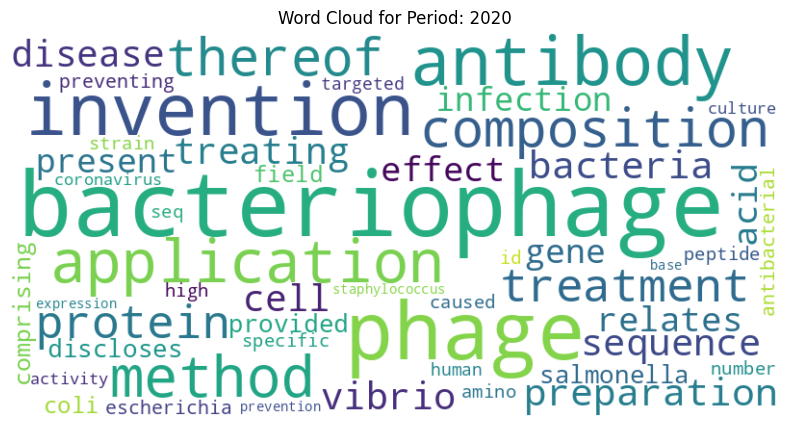

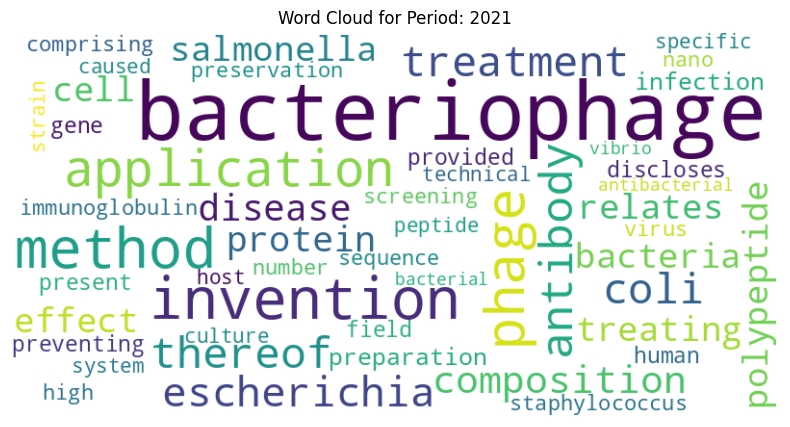

In [47]:
term_occurrences = count_all_term_occurrences_by_period(data, text_columns, period_column)
periods_to_visualize = [2020, 2021]  # Replace with the periods you want to visualize

visualize_word_clouds_from_frequencies(term_occurrences, periods_to_visualize)




```
Interpreting the results from a word cloud generated from term frequencies involves understanding the visual representation of the data. Here are some key points to guide your interpretation:

1. **Size of Words**: In a word cloud, the size of each word is proportional to its frequency in the text. Larger words are more frequent in the documents of the period you're analyzing. These are the terms that dominate the discourse or are most commonly used in that timeframe.

2. **Comparison Across Periods**: By looking at word clouds for different periods, you can track changes in focus or interest over time. For example, if certain terms become larger or smaller in subsequent periods, this indicates an increase or decrease in their usage or relevance.

3. **Contextual Interpretation**: It's essential to interpret the terms within the context of the data source. For instance, in a dataset of patent documents, prevalent terms might indicate areas of technological innovation or research focus in those periods.

4. **Identifying Key Themes and Trends**: Look for themes or trends that emerge from the most frequent terms. This can give insights into the main topics or areas of interest in your dataset during each period.

5. **Impact of Preprocessing**: The results are influenced by how the data was preprocessed. For example, merging term variants, removing stopwords, and other cleaning steps will affect which terms appear in the word cloud and their relative sizes.

6. **Presence of Unexpected Terms**: Sometimes, word clouds can reveal surprising or unexpected terms that may warrant further investigation. These could be emerging topics, new technologies, or even data anomalies.

7. **Limitations of Word Clouds**: While visually engaging, word clouds do not provide detailed quantitative information. They are better used for getting a general sense of the data or for generating hypotheses rather than for in-depth analysis.

8. **Background Knowledge**: Your understanding of the subject matter can greatly aid in interpreting the word clouds. Background knowledge can help you discern why certain terms are prominent and understand their significance in the context of the dataset.

In summary, word clouds offer a visual method for quickly grasping the most prominent terms in your dataset for each period. They are particularly useful for identifying major themes and trends and for comparing changes over time. However, for a more detailed and nuanced understanding, it might be necessary to complement this analysis with other quantitative methods.
```



## extract_keywords_tfidf_by_period

In [48]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

def extract_keywords_tfidf_by_period(data, text_columns, period_column, ngram_range=(1, 1),
                                     proportion=0.1, exclude_words=[]):
    """
    Extracts keywords from specified columns in a DataFrame using TF-IDF for each period
    specified in the period column and returns them in separate DataFrames, skipping periods with insufficient data.

    Args:
    data (DataFrame): Pandas DataFrame containing the data.
    text_columns (list of str): List of text column names to analyze.
    period_column (str): Column name containing the year range period.
    ngram_range (tuple): The ngram range for TF-IDF Vectorization (default is (1, 1)).
    proportion (float): Proportion of top keywords to extract (default is 0.1).
    exclude_words (list of str): List of words to exclude from the results.

    Returns:
    dict: A dictionary with periods as keys and DataFrames as values. Includes a special key 'skipped_periods' for any periods that were skipped.
    """
    # Verify if the columns exist
    for col in text_columns + [period_column]:
        if col not in data.columns:
            raise ValueError(f"Column '{col}' does not exist in DataFrame.")

    # Group by period column
    grouped_data = data.groupby(period_column)

    # Output dictionary and skipped periods list
    period_keywords = {}
    skipped_periods = []

    for period, group in grouped_data:
        try:
            # Merge the text columns for analysis
            group['merged_text'] = group[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)

            # Apply TF-IDF vectorization
            tfidf = TfidfVectorizer(ngram_range=ngram_range)
            tfidf_matrix = tfidf.fit_transform(group['merged_text'])

            # Sum TF-IDF frequency of each term through documents and count document frequency
            sums = tfidf_matrix.sum(axis=0)
            doc_freq = (tfidf_matrix > 0).sum(axis=0)

            # Connecting term to its sums frequency and document frequency
            terms_data = []
            for col, term in enumerate(tfidf.get_feature_names_out()):
                if term not in exclude_words:  # Exclude the irrelevant words
                    terms_data.append((term, sums[0, col], doc_freq[0, col]))

            ranking = pd.DataFrame(terms_data, columns=['Term', 'Score', 'DocCount'])
            ranking = ranking.sort_values('Score', ascending=False)

            # Determine the number of top keywords to extract
            top_n = int(len(ranking) * proportion)
            top_keywords = ranking.head(top_n)

            # Add rank column
            top_keywords['Rank'] = range(1, top_n + 1)

            # Add to the output dictionary
            period_keywords[period] = top_keywords[['Rank', 'Term', 'Score', 'DocCount']]
        except ValueError:
            # Skip periods with empty vocabulary and record them
            skipped_periods.append(period)

    # Add skipped periods to the output dictionary
    period_keywords['skipped_periods'] = skipped_periods

    return period_keywords


In [49]:
# Blacklist of generic and non-useful keywords/bigrams
blacklist = ["prior art",'invention', 'present', "object invention",'disclosed', "disclosed herein", "present invention", "embodiment invention","invention discloses","invention relates",
             "thereof invention","bacteriophage bacteriophage","relates bacteriophage","comprising bacteriophage","bacteriophage present", 'relates','related',
             "invention provides","and or","invention relates","claim wherein","non non","per cent","may used","information related",'wherein',
             "according claim","method claim", "wherein said","least one","according claim","method claim", "wherein said","least one","least 10","sp sp",
             "purpose obtain","problem solved","solved obtain","effective amount","invention also","10 per","least per",'method','also','obtain','solved',
             'present invention relates','application thereof invention','invention relates bacteriophage','application thereof','method thereof','thereof present',
'invention method','comprises step','belongs technical','relates method','invention belongs','provided invention','disclosed invention','comprising present',
'present disclosure','disclosed method','method comprises','provided method','thereof invention discloses','method application thereof','belongs technical field',
'thereof invention relates','thereof present invention','invention relates method','comprising present invention',
'present invention directed','selected group consisting','relates technical field','invention relates composition','utility model discloses',
'method thereof invention','present invention method','invention relates technical','present invention discloses','invention discloses method',
'present invention variously','application thereof belongs','invention variously field','disinfectant cleaning agent'
             ]  # Add more terms as needed


In [50]:
result = extract_keywords_tfidf_by_period(
    data=cleaned_data,
    text_columns=['cleaned_merged_column'],  # Make sure this is a list
    period_column='Application_Year_Range',
    ngram_range=(1, 3),
    proportion=0.1,
    exclude_words=blacklist
)


<ipython-input-48-94e7dd9e79d3>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_keywords['Rank'] = range(1, top_n + 1)
<ipython-input-48-94e7dd9e79d3>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_keywords['Rank'] = range(1, top_n + 1)
<ipython-input-48-94e7dd9e79d3>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

In [51]:
# The result will be a dictionary with each key being a period and its value being a DataFrame of keywords.

# To see the periods that were skipped:
skipped_periods = result['skipped_periods']
skipped_periods

['1950-1954']

In [52]:
data[data['Application_Year_Range']=='1950-1954']

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Topic N°,Application Year,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Number of Unique Applicants,Number of Unique Inventors,Number of Unique IPCR Sections,Number of Unique IPCR Class,Number of Unique IPCR Subclass,Number of Unique IPCR Classifications,cleaned_merged_column,merged_text


In [53]:
# To access the keywords for a specific period, use the period as the key.
keywords_2000_2010 = result['2020-2024']
keywords_2000_2010

,Rank,Term,Score,DocCount
6030,1,bacteriophage,25.527535,400
3090,2,antibody,14.326681,97
40357,3,phage,12.889380,310
13634,4,composition,10.348637,181
4122,5,application,10.055170,344
...,...,...,...,...
15992,6250,crispr system selectively,0.172910,3
36179,6251,msbc embodiment include,0.172910,3
33902,6252,medi msbc embodiment,0.172910,3
5467,6253,bacteria coli pseudomonas,0.172910,3


### visualize_word_clouds

In [54]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def visualize_word_clouds(tfidf_results, periods_to_visualize, num_keywords=10):
    """
    Generates word cloud visualizations for specified periods from TF-IDF results,
    displaying them in a single figure with subplots, sorted by period. Enhanced for readability and storytelling.

    Args:
    tfidf_results (dict): Dictionary with TF-IDF results.
    periods_to_visualize (list): List of periods to generate word clouds for, sorted by period name.
    num_keywords (int): Number of top keywords to include in the word cloud.

    Returns:
    None: Displays the word clouds in subplots.
    """
    # Sort the periods to visualize
    periods_to_visualize = sorted(periods_to_visualize)

    num_periods = len(periods_to_visualize)
    num_cols = min(5, num_periods)
    num_rows = (num_periods + num_cols - 1) // num_cols  # Ceiling division for rows

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 6, num_rows * 6))
    axes = axes.flatten() if num_periods > 1 else [axes]

    for idx, period in enumerate(periods_to_visualize):
        ax = axes[idx] if num_periods > 1 else axes
        if period in tfidf_results:
            # Get top N keywords for the period
            keywords_df = tfidf_results[period].head(num_keywords)
            keywords_dict = dict(zip(keywords_df['Term'], keywords_df['Score']))

            # Generate word cloud
            wordcloud = WordCloud(width=600, height=400, background_color='white').generate_from_frequencies(keywords_dict)

            # Plot in subplot
            ax.imshow(wordcloud, interpolation='bilinear')
            ax.set_title(f"Word Cloud for : {period}", fontsize=20)
            ax.axis("off")
        else:
            ax.text(0.5, 0.5, f"No data for {period}", horizontalalignment='center', verticalalignment='center', fontsize=12)
            ax.axis("off")

    # Hide unused subplots
    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
#tfidf_results = ...  # Your TF-IDF results
#periods_to_visualize = ['2022', '2020', '2021']  # Periods you want to visualize

#visualize_word_clouds(tfidf_results, periods_to_visualize)


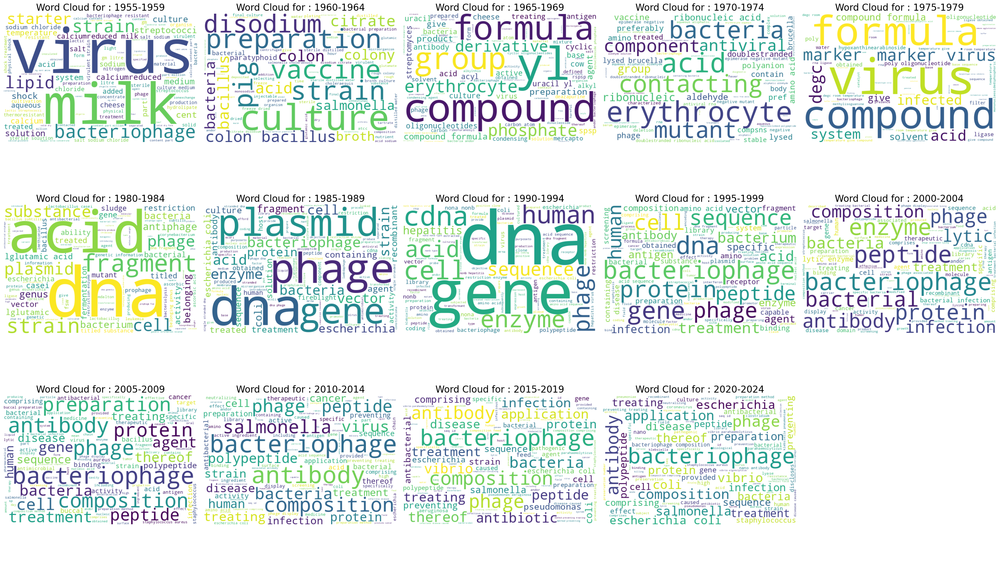

In [55]:
tfidf_results = result # Your TF-IDF results dictionary

# Define the periods you want to visualize
periods_to_visualize = data['Application_Year_Range'].unique().to_list() #['2020-2024', '2015-2019', '2010-2014'] # Periods


visualize_word_clouds(tfidf_results, periods_to_visualize,num_keywords=100)

In [56]:
result = extract_keywords_tfidf_by_period(
    data=cleaned_data,
    text_columns=['cleaned_merged_column'],  # Make sure this is a list
    period_column='Jurisdiction_Region',
    ngram_range=(1, 3),
    proportion=0.1,
    exclude_words=blacklist
)


<ipython-input-48-94e7dd9e79d3>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_keywords['Rank'] = range(1, top_n + 1)
<ipython-input-48-94e7dd9e79d3>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_keywords['Rank'] = range(1, top_n + 1)
<ipython-input-48-94e7dd9e79d3>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

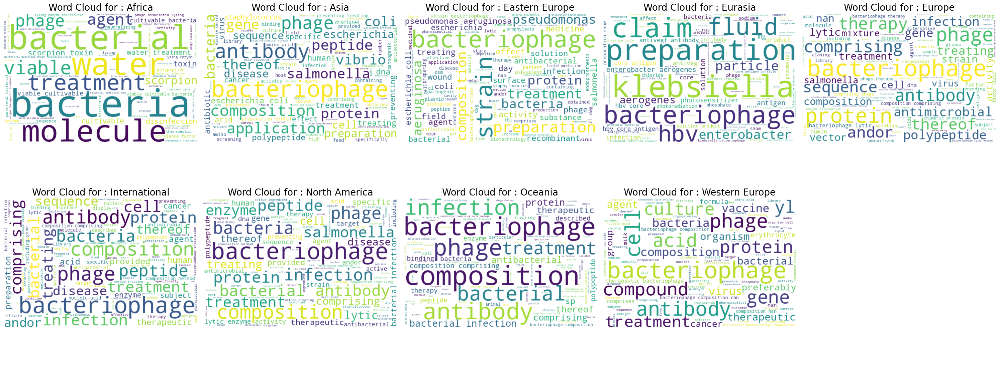

In [57]:
tfidf_results = result # Your TF-IDF results dictionary

# Define the periods you want to visualize
periods_to_visualize = sorted(list(data['Jurisdiction_Region'].unique())) #['2020-2024', '2015-2019', '2010-2014'] # Periods


visualize_word_clouds(tfidf_results, periods_to_visualize,num_keywords=100)

In [58]:
sorted(list(data['Jurisdiction_Region'].unique()))#.to_list()

['Africa',
 'Asia',
 'Eastern Europe',
 'Eurasia',
 'Europe',
 'International',
 'North America',
 'Oceania',
 'Western Europe']



```
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def visualize_word_clouds(tfidf_results, periods_to_visualize, num_keywords=10):
    """
    Generates word cloud visualizations for specified periods from TF-IDF results.

    Args:
    tfidf_results (dict): Dictionary with TF-IDF results as returned by the extract_keywords_tfidf_by_period function.
    periods_to_visualize (list): List of periods to generate word clouds for.
    num_keywords (int): Number of top keywords to include in the word cloud.

    Returns:
    None: Displays the word clouds.
    """
    for period in periods_to_visualize:
        if period in tfidf_results:
            # Get top N keywords for the period
            keywords_df = tfidf_results[period].head(num_keywords)
            keywords_dict = dict(zip(keywords_df['Term'], keywords_df['Score']))

            # Generate word cloud
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(keywords_dict)

            # Plot
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.title(f"Word Cloud for : {period}")
            plt.axis("off")
            plt.show()
        else:
            print(f"No data available for : {period}")

```





```
# Assuming 'tfidf_results' is the output from your extract_keywords_tfidf_by_period function
tfidf_results = result # Your TF-IDF results dictionary

# Define the periods you want to visualize
periods_to_visualize = data['Application_Year_Range'].unique().to_list() #['2020-2024', '2015-2019', '2010-2014'] # Periods

# Define the number of top keywords you want in each word cloud
num_keywords = 100 # Example number of keywords

# Call the visualize_word_clouds function
visualize_word_clouds(tfidf_results, periods_to_visualize, num_keywords)



```



## create_graphs_for_year_ranges_greedy_modularity

In [59]:
!pip install python-louvain


<ipython-input-60-c0556ab1a878>:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


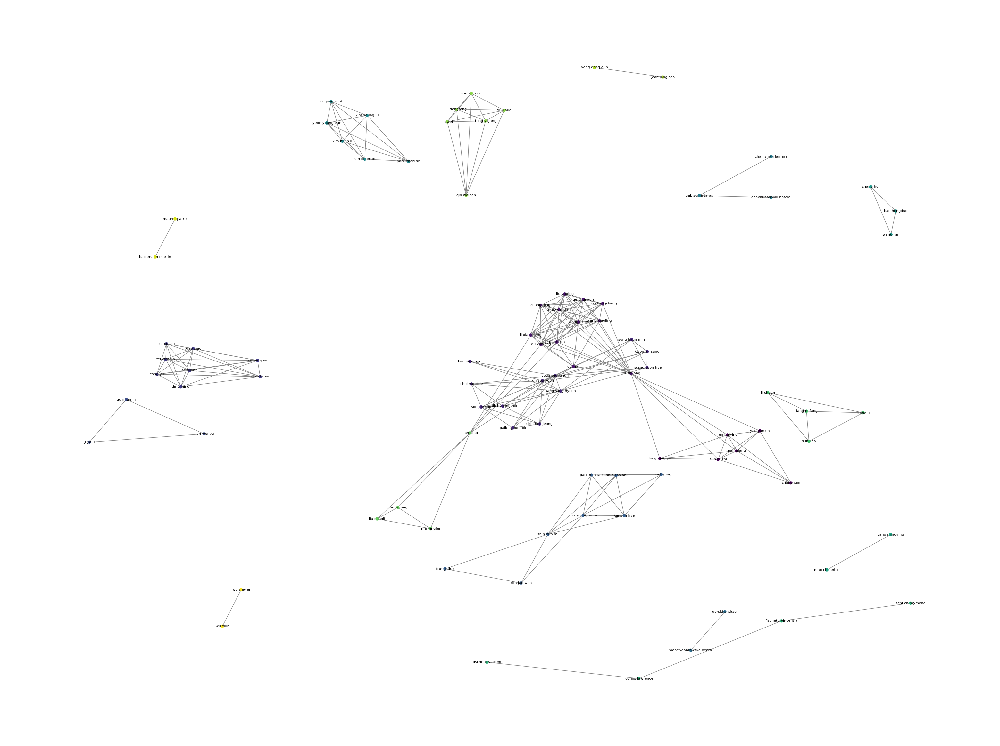

In [60]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter
import community as community_louvain
import community.community_louvain as cl


def build_and_visualize_network(data, entity_column, delimiter=';;', region=None, year_range=None, top_n_entities=None):
    # Filter data based on region and year range if specified
    if region is not None:
        data = data[data['Region'] == region]
    if year_range is not None:
        data = data[(data['Year'] >= year_range[0]) & (data['Year'] <= year_range[1])]

    # Split entities, ensuring to handle NaN values
    data['Entities'] = data[entity_column].fillna('').str.lower().str.split(delimiter)

    # If top_n_entities is specified, filter to include only these entities
    if top_n_entities is not None:
        top_entities = data['Entities'].explode().value_counts().head(top_n_entities).index.tolist()
        data['Entities'] = data['Entities'].apply(lambda entities: [entity for entity in entities if entity in top_entities])

    # Create the network
    G = nx.Graph()
    for entities in data['Entities']:
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                if entities[i] and entities[j]:  # Ensure that both entities are non-empty
                    G.add_edge(entities[i], entities[j])

    # Detect communities
    partition = cl.best_partition(G)

    # Draw the network
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.15, iterations=20)
    cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
    nx.draw_networkx(G, pos, node_color=[partition.get(node) for node in G.nodes()], node_size=40, font_size=8, cmap=cmap, edge_color="grey")
    plt.axis('off')
    plt.show()

    return G

# Example Usage
# Assume 'data' is your DataFrame with the necessary columns
G = build_and_visualize_network(cleaned_data, 'Inventors', delimiter=';;', region=None, year_range=None, top_n_entities=100)


In [61]:
#G = build_and_visualize_network(cleaned_data, 'cleaned_merged_column', delimiter=' ', region=None, year_range=None, top_n_entities=100)


In [62]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import defaultdict

def draw_centrality_network(data, column, top_n=200, centrality_measure='degree'):
    """
    Draw a network graph based on a specified centrality measure for top N inventors
    with the edge width reflecting the strength of collaboration.

    Args:
    - data (pd.DataFrame): DataFrame containing the inventor data.
    - column (str): The column name in the DataFrame that contains the inventors' names.
    - top_n (int): Number of top inventors to consider for the network.
    - centrality_measure (str): The type of centrality measure to use.

    Returns:
    None
    """
    # Data cleaning and parsing
    data2 = data.dropna(subset=[column]).copy()
    data2[column] = data2[column].apply(lambda x: x.lower().split(';;') if isinstance(x, str) else [])

    # Select the top N inventors
    top_inventors = data[column].str.split(';;').explode().str.strip().value_counts().head(top_n).index.tolist()
    top_inventors = [name.lower() for name in top_inventors]

    # Filter data for top inventors only and remove NaN entries
    data2[column] = data2[column].apply(lambda x: [inventor for inventor in x if inventor in top_inventors])

    # Create a dictionary for application counts
    application_counts = pd.Series(data2[column].explode()).value_counts().to_dict()

    # Initialize a defaultdict to store collaboration strength
    collaboration_strength = defaultdict(int)

    # Calculate the weight (strength) of the collaboration between each pair of inventors
    for inventors in data2[column]:
        for i in range(len(inventors)):
            for j in range(i + 1, len(inventors)):
                edge = tuple(sorted([inventors[i], inventors[j]]))
                collaboration_strength[edge] += 1

    # Create the network
    G = nx.Graph()

    # Add nodes with attributes for application counts
    for inventor, count in application_counts.items():
        G.add_node(inventor, applications=count)

    # Add edges with the collaboration strength as weight
    for (inventor_a, inventor_b), weight in collaboration_strength.items():
        G.add_edge(inventor_a, inventor_b, weight=weight)

    # Choose the centrality measure
    centrality_dict = {
        'degree': nx.degree_centrality,
        'closeness': nx.closeness_centrality,
        'betweenness': nx.betweenness_centrality,
        'eigenvector': nx.eigenvector_centrality
    }

    # Calculate the selected centrality measure
    if centrality_measure in centrality_dict:
        centrality = centrality_dict[centrality_measure](G)
    else:
        raise ValueError(f"Centrality measure '{centrality_measure}' is not supported.")

    # Node sizes based on application counts
    node_sizes = [100 * G.nodes[node]['applications'] for node in G]

    # Centrality values for node colors
    centrality_values = list(centrality.values())

    # Normalize centrality values for node color
    max_centrality = max(centrality_values, default=0)
    centrality_values = [c / max_centrality for c in centrality_values] if max_centrality else centrality_values

    # Edge widths based on collaboration strength
    edge_widths = [G[u][v]['weight'] for u, v in G.edges()]
    max_edge_width = max(edge_widths) if edge_widths else 1
    edge_widths = [ew / max_edge_width * 50 for ew in edge_widths]  # Normalize and scale edge width for visibility

    # Draw the network
    plt.figure(figsize=(40, 30))
    pos = nx.spring_layout(G, k=0.15, iterations=20)
    nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.5, edge_color='blue')
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=centrality_values, cmap=cm.YlOrRd)
    nx.draw_networkx_labels(G, pos, font_size=12, font_color='black')

    plt.title(f'Co-{column.capitalize()} Network with {centrality_measure.capitalize()} Centrality', fontsize=20)
    plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),
                 label=f'{centrality_measure.capitalize()} Centrality', orientation='vertical')
    plt.axis('off')
    plt.show()

# Example usage:
# Assuming 'data' is your DataFrame with a column 'Inventors' containing the inventor lists
# data = pd.read_csv('your_dataset.csv') # Replace with your actual data loading method
#draw_centrality_network(data, 'Inventors', top_n=200, centrality_measure='degree')


<ipython-input-62-66000a1435b7>:93: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(cm.ScalarMappable(cmap=cm.YlOrRd, norm=plt.Normalize(vmin=0, vmax=max_centrality)),


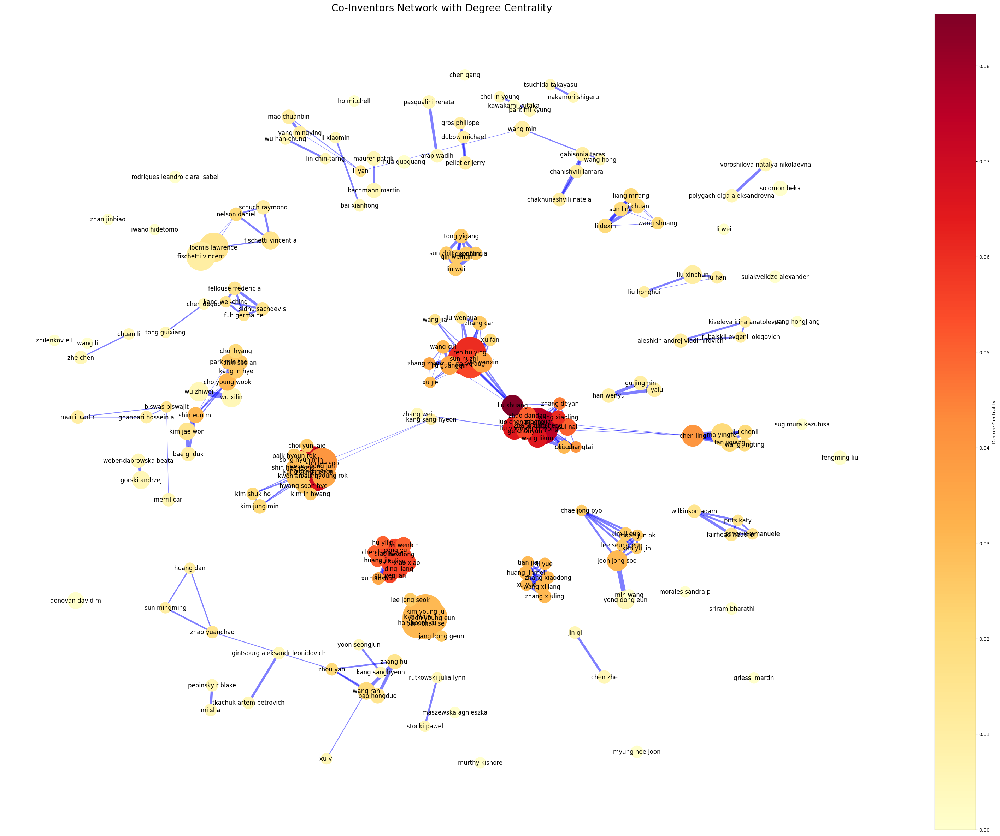

In [63]:
draw_centrality_network(cleaned_data, 'Inventors', top_n=200, centrality_measure='degree')

In [64]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import Counter
from networkx.algorithms import community as nx_community
from itertools import combinations

def create_graphs_for_year_ranges_greedy_modularity(dataframe, entity_column, year_range_column):
    # Handle NaNs and ensure consistent data type for sorting
    dataframe[year_range_column] = dataframe[year_range_column].astype(str)

    # Sort year ranges and iterate over each one
    for year_range in sorted(dataframe[year_range_column].unique()):
        df_subset = dataframe[dataframe[year_range_column] == year_range]
        df_subset = df_subset.dropna(subset=[entity_column])

        # Convert each entity's name to lowercase and select top entities
        df_subset[entity_column] = df_subset[entity_column].apply(lambda x: x.lower().split() if isinstance(x, str) else [])
        top_entities = Counter([entity for entities in df_subset[entity_column] for entity in entities]).most_common(10000)
        top_entities = [entity[0] for entity in top_entities]

        # Filter the data to include only top entities
        df_subset[entity_column] = df_subset[entity_column].apply(lambda x: [entity for entity in x if entity in top_entities])

        # Create the network
        G = nx.Graph()
        for entities in df_subset[entity_column]:
            for i in range(len(entities)):
                for j in range(i + 1, len(entities)):
                    G.add_edge(entities[i], entities[j])

        # Detect communities using the greedy modularity method
        if G.number_of_edges() > 0:
            communities = nx_community.greedy_modularity_communities(G)
            community_map = {node: idx for idx, community in enumerate(communities) for node in community}

            # Convert entity counts to a list of node sizes for the network plot
            entity_counts = Counter(df_subset[entity_column].explode())
            node_sizes = [entity_counts[node] * 100 for node in G.nodes()]

            # Draw the network
            plt.figure(figsize=(40, 30))
            pos = nx.spring_layout(G, k=0.15, iterations=20)
            nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, font_size=12, font_color='black', node_color=[community_map[node] for node in G.nodes()], edge_color='gray', cmap=plt.cm.jet)
            plt.axis('off')
            plt.title(f'Co-entity Network with Community Detection for {year_range}', fontsize=30)
            plt.show()

# Example usage with your dataset
# create_graphs_for_year_ranges_greedy_modularity(data, 'Applicants', 'Application_Year_Range')


In [65]:
cleaned_data['cleaned_merged_column']

0       method tuberculosis phagotherapy field medicin...
1       antibacterial phage phage peptide method there...
2       antibacterial phage phage peptide method there...
3       antibacterial phage phage peptide method there...
4       antibacterial phage phage peptide method there...
                              ...                        
2360    dinucleoside phosphate dinucleoside phosphate ...
2361    dinucleoside phosphate dinucleoside phosphate ...
2362    probe combination detection cancer internation...
2363    method related composition manufacturing food ...
2364    hbv core antigen particle multiple immunogenic...
Name: cleaned_merged_column, Length: 2365, dtype: object

In [66]:
#create_graphs_for_year_ranges_greedy_modularity(cleaned_data, 'cleaned_merged_column', 'Application_Year_Range')

## create_network_graph

In [67]:
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from itertools import combinations
from collections import defaultdict, Counter

def calculate_co_occurrences(docs, terms, threshold=20):
    """
    Calculate co-occurrences of terms and return pairs that meet the threshold.
    """
    co_occurrences = defaultdict(int)
    for doc in docs:
        words = set(doc.split())  # Create a set of unique words per document
        for term1, term2 in combinations(terms, 2):
            if term1 in words and term2 in words:
                co_occurrences[(term1, term2)] += 1

    return {pair: count for pair, count in co_occurrences.items() if count >= threshold}


def build_network_graphs(data, text_columns, period_column, ngram_range=(1, 1), top_n=20, exclude_words=[], co_occurrence_threshold=20):
    """
    ... [existing docstring] ...
    """
    grouped_data = data.groupby(period_column)

    for period, group in grouped_data:
        merged_texts = group[text_columns].apply(lambda row: ' '.join(row.values.astype(str)))

        try:
            processed_exclude_words = [word.lower() for word in exclude_words]  # Example for lowercasing

            tfidf = TfidfVectorizer(ngram_range=ngram_range, stop_words=processed_exclude_words)
            tfidf_matrix = tfidf.fit_transform(merged_texts)
        except ValueError as e:
            print(f"Skipping period {period} due to error: {e}")
            continue

        feature_names = tfidf.get_feature_names_out()
        scores = tfidf_matrix.sum(axis=0).A.flatten()

        # Select top N terms based on TF-IDF scores
        top_indices = scores.argsort()[-top_n:][::-1]
        top_terms = feature_names[top_indices]
        top_scores = scores[top_indices]

        # Calculate co-occurrences
        co_occurrences = calculate_co_occurrences(merged_texts, top_terms, threshold=co_occurrence_threshold)

        # Build the network graph
        G = nx.Graph()
        for term, score in zip(top_terms, top_scores):
            G.add_node(term, size=score * 1000)

        # Add edges based on co-occurrence threshold
        for (term1, term2), _ in co_occurrences.items():
            if term1 in G and term2 in G:
                G.add_edge(term1, term2)

        # Draw the network graph
        plt.figure(figsize=(12, 12))
        pos = nx.spring_layout(G, k=.75, iterations=20)
        nx.draw_networkx(G, pos, with_labels=True, node_size=[G.nodes[node]['size'] for node in G.nodes],
                         node_color='skyblue', edge_color='gray', font_weight='bold')
        plt.title(f"Network Graph for Period: {period}", fontsize=16)
        plt.axis('off')
        plt.show()



#

In [68]:
data = cleaned_data # Your DataFrame
text_columns = ['cleaned_merged_column']  # Replace with your actual text column names
period_column = 'Application_Year_Range'  # Replace with your actual period column name
ngram_range = (1, 2)
top_n = 100
exclude_words = blacklist  # Example exclude words
co_occurrence_threshold = 2

#build_network_graphs(data, text_columns, period_column, ngram_range, top_n, exclude_words, co_occurrence_threshold)


In [69]:
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from itertools import combinations

def build_network_graphs(data, text_columns, period_column, ngram_range=(1, 1), top_n=20, exclude_words=[]):
    """
    Builds and visualizes network graphs with node size reflecting term importance (TF-IDF score)
    and edge thickness based on a basic relationship metric.
    """
    grouped_data = data.groupby(period_column)

    for period, group in grouped_data:
        merged_text = ' '.join(group[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1))

        try:
            tfidf = TfidfVectorizer(ngram_range=ngram_range, stop_words=exclude_words)
            tfidf_matrix = tfidf.fit_transform([merged_text])
        except ValueError as e:
            print(f"Skipping period {period} due to error: {e}")
            continue

        feature_names = tfidf.get_feature_names_out()
        scores = tfidf_matrix.toarray().flatten()

        # Select top N terms
        top_indices = scores.argsort()[-top_n:][::-1]
        top_terms = feature_names[top_indices]
        top_scores = scores[top_indices]

        # Build the network graph
        G = nx.Graph()
        for term, score in zip(top_terms, top_scores):
            G.add_node(term, size=score)

        # Add edges with basic relationship (for demonstration purposes)
        for term1, term2 in combinations(top_terms, 2):
            G.add_edge(term1, term2, weight=0.5)  # Weight can be adjusted based on specific relationships

        # Draw the network graph
        plt.figure(figsize=(12, 12))
        pos = nx.spring_layout(G, k=0.15, iterations=20)

        # Node sizes based on TF-IDF scores
        node_sizes = [G.nodes[node]['size'] * 1000 for node in G.nodes]

        # Edge thickness based on weight
        edge_weights = [G[u][v]['weight'] for u, v in G.edges]

        nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, width=edge_weights,
                         node_color='skyblue', edge_color='gray', font_weight='bold')
        plt.title(f"Network Graph for Period: {period}", fontsize=16)
        plt.axis('off')
        plt.show()

# Example usage
#data = ...  # your DataFrame
#text_columns = ['text_column_name']  # Replace with your text column name(s)
#period_column = 'year_column_name'  # Replace with your period column name
#ngram_range = (1, 1)
#top_n = 20
#exclude_words = ['example_exclude_word']

#build_network_graphs(data, text_columns, period_column, ngram_range, top_n, exclude_words)


In [70]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from itertools import combinations

def build_network_graphs(data, text_columns, period_column, ngram_range=(1, 1), top_n=20, exclude_words=[]):
    """
    Builds network graphs for each period based on TF-IDF analysis of the terms.

    Args:
    data (DataFrame): Pandas DataFrame containing the data.
    text_columns (list of str): List of text column names to analyze.
    period_column (str): Column name containing the period.
    ngram_range (tuple): The ngram range for TF-IDF Vectorization.
    top_n (int): Number of top terms to include in the network graph.
    exclude_words (list of str): List of words to exclude from the analysis.

    Returns:
    None: Displays network graphs for each period.
    """
    # Group by period
    grouped_data = data.groupby(period_column)

    for period, group in grouped_data:
        merged_text = ' '.join(group[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1))

        try:
            tfidf = TfidfVectorizer(ngram_range=ngram_range, stop_words=exclude_words)
            tfidf_matrix = tfidf.fit_transform([merged_text])
        except ValueError as e:
            print(f"Skipping period {period} due to error: {e}")
            continue  # Skip this period and continue with the next

        feature_names = tfidf.get_feature_names_out()
        scores = tfidf_matrix.toarray().flatten()

        # Get top N terms based on TF-IDF scores
        top_indices = scores.argsort()[-top_n:][::-1]
        top_terms = feature_names[top_indices]

        # Build the network graph
        G = nx.Graph()
        for term in top_terms:
            G.add_node(term)

        # Add edges between all top terms (can be adjusted to represent specific relationships)
        for term1, term2 in combinations(top_terms, 2):
            G.add_edge(term1, term2)

        # Draw the network graph
        plt.figure(figsize=(12, 12))
        pos = nx.spring_layout(G, k=0.15, iterations=20)
        nx.draw_networkx(G, pos, with_labels=True,  node_color='skyblue', edge_color='gray')
        plt.title(f"Term Network for Period: {period}", fontsize=16)
        plt.axis('off')
        plt.show()

# Example usage




In [71]:
data = cleaned_data # Your DataFrame
text_columns = ['cleaned_merged_column']  # Replace with your actual text column names
period_column = 'Application_Year_Range'  # Replace with your actual period column name
ngram_range = (1, 2)
top_n = 100
exclude_words = blacklist  # Example exclude words

#build_network_graphs(data, text_columns, period_column, ngram_range, top_n, exclude_words)


## Selection of the terms you want to study

In [72]:
microorganisms_2020_2024_top500 = ['salmonella','vibrio','escherichia','escherichia coli','staphylococcus','coronavirus','parahaemolyticus','clostridium',
'vibrio parahaemolyticus','aureus','klebsiella','staphylococcus aureus','pseudomonas','klebsiella pneumoniae','virus',
'salmonella bacteriophage','vibrio alginolyticus','alginolyticus','sarscov','escherichia coli bacteriophage','coli bacteriophage',
'streptococcus','aeromonas','perfringens','	clostridium perfringens','escherichia coli phage','coli phage','anatipestifer','riemerella anatipestifer',
'riemerella','pathogenic escherichia coli','pathogenic escherichia','alginolyticus bacteriophage','vibrio alginolyticus bacteriophage',
'aeruginosa','pseudomonas aeruginosa','solanacearum','parahaemolyticus bacteriophage','vibrio parahaemolyticus bacteriophage',
'pneumoniae bacteriophage','klebsiella pneumoniae bacteriophage','xanthomonas','coliphage','aureus bacteriophage','aeromonas hydrophila',
'staphylococcus aureus bacteriophage','edwardsiella','clostridium welchii','welchii','shigella','bacteroides','bacteroides fragilis',
'fragilis','ralstonia solanacearum','ralstonia','pullorum','covid','bacillus','coronavirus sarscov']

In [73]:
microorganisms_2020_2024_top500 = ['coronavirus','escherichia coli','staphylococcus aureus','pseudomonas aeruginosa',
                                   'klebsiella pneumoniae','vibrio parahaemolyticus','vibrio alginolyticus','clostridium perfringens',
                                   'clostridium welchii','bacteroides fragilis','ralstonia solanacearum','aeromonas hydrophila',
                                   'riemerella anatipestifer']

In [74]:
# Term variants
term_variants_microorganisms_2020_2024_top500 = {
    'coronavirus': ['covid', 'coronavirus sarscov','sarscov','coronavirus'],
    'escherichia coli': ['escherichia coli','escherichia','coli'],
    'staphylococcus aureus': ['staphylococcus aureus','aureus'],
    'pseudomonas aeruginosa': ['pseudomonas aeruginosa','aeruginosa','pseudomonas'],
    'klebsiella pneumoniae': ['klebsiella pneumoniae','klebsiella'],
    'vibrio parahaemolyticus': ['vibrio parahaemolyticus','parahaemolyticus'],
    'vibrio alginolyticus': ['vibrio alginolyticus','alginolyticus'],
    'clostridium perfringens': ['clostridium perfringens','perfringens'],
    'clostridium welchii': ['clostridium welchii','welchii'],
    'bacteroides fragilis': ['bacteroides fragilis','fragilis'],
    'ralstonia solanacearum': ['ralstonia solanacearum','solanacearum'],
    'aeromonas hydrophila': ['aeromonas hydrophila'],
    'riemerella anatipestifer': ['riemerella anatipestifer','anatipestifer']

    # Add more variants if needed
}

In [75]:
keywords_df_1

,Rank,Term,Score,DocCount
1191,1,bacteriophage,138.015904,1381
673,2,antibody,85.863846,412
8885,3,phage,82.766698,1209
2520,4,composition,82.122704,764
1162,5,bacteria,57.028278,593
...,...,...,...,...
5452,13377,hepadnavirus,0.009708,1
5335,13378,hantaviruses,0.009708,1
12359,13379,truncates,0.009708,1
5255,13380,gsllgrmkga,0.009708,1


In [76]:
keywords_df_2

,Rank,Term,Score,DocCount
29031,1,escherichia coli,27.036480,223
60088,2,preventing treating,19.605433,319
3565,3,amino acid,17.975396,286
17395,4,composition comprising,17.849517,273
69838,5,seq id,16.518237,201
...,...,...,...,...
55434,85217,phage animal,0.009303,1
34633,85218,glycoprotein antibody,0.009303,1
34632,85219,glycopeptides carbohydrate,0.009303,1
55250,85220,pertussis haemophilus,0.009303,1


In [77]:
keywords_df_3

,Rank,Term,Score,DocCount
5179,1,amino acid sequence,14.366049,249
59863,2,infectious disease caused,9.049051,80
71343,3,method preventing treating,8.863670,105
119226,4,treating infectious disease,7.611825,72
105765,5,shown seq id,7.536466,91
...,...,...,...,...
33240,126384,cytomegalovirus epsteinbarr virus,0.010779,1
92329,126385,prophylactically effective amount,0.010779,1
20584,126386,capsidbinding peptide characterized,0.010779,1
86084,126387,pneumococcal pneumonia yellow,0.010779,1


## plot_term_trends (TF-IDF Score)

In [78]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

def preprocess_terms_with_variants(data, text_columns, term_variants):
    """
    Preprocesses the data by replacing variants of a term with a standardized term.
    """
    if isinstance(text_columns, str):
        text_columns = [text_columns]

    for standard_term, variants in term_variants.items():
        for variant in variants:
            for col in text_columns:
                if col in data.columns:
                    # Replace each variant with the standard term
                    data[col] = data[col].astype(str).str.replace(variant, standard_term, case=False, regex=True)
    return data

def plot_term_trends_with_variants(data, text_columns, year_column, terms_to_study, term_variants, ngram_range=(1, 1), exclude_words=[]):
    """
    Plots the trend of specific terms (including their variants) across different years.
    """
    # Preprocess terms with their variants
    data = preprocess_terms_with_variants(data, text_columns, term_variants)

    # Create a DataFrame to store term scores by year
    term_trends = pd.DataFrame(index=sorted(data[year_column].unique()))

    for term in terms_to_study:
        term_trends[term] = 0  # Initialize columns for each term

    for year in sorted(data[year_column].unique()):
        # Filter data for the current year
        year_data = data[data[year_column] == year]
        year_data['merged_text'] = year_data[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)

        # Apply TF-IDF vectorization
        tfidf = TfidfVectorizer(ngram_range=ngram_range, stop_words=exclude_words)
        tfidf_matrix = tfidf.fit_transform(year_data['merged_text'])

        # Get scores for terms of interest
        for term in terms_to_study:
            if term in tfidf.get_feature_names_out():
                term_index = tfidf.get_feature_names_out().tolist().index(term)
                term_score = tfidf_matrix.sum(axis=0).A[0][term_index]
                term_trends.at[year, term] = term_score

    # Plotting
    num_terms = len(terms_to_study)
    num_cols = min(5, num_terms)
    num_rows = max(1, (num_terms + num_cols - 1) // num_cols)  # Ceiling division

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
    axes = axes.flatten() if num_terms > 1 else [axes]

    for idx, term in enumerate(terms_to_study):
        ax = axes[idx] if num_terms > 1 else axes
        ax.plot(term_trends.index, term_trends[term], marker='o', label=term)
        ax.set_title(f"Trend of '{term}'")
        ax.set_xlabel('Year')
        ax.set_ylabel('TF-IDF Score')
        ax.legend()

    # Hide unused subplots
    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
#data = ... # Your DataFrame
#text_columns = 'your_text_column'  # Replace with your actual text column name
#year_column = 'your_year_column'  # Replace with your actual year column name
#terms_to_study = ['term1', 'term2']  # Terms you want to study
#term_variants = {'term1': ['variant1_1', 'variant1_2'], 'term2': ['variant2_1', 'variant2_2']}
#ngram_range = (1, 1)
#exclude_words = ['exclude1', 'exclude2']

#plot_term_trends_with_variants(data, text_columns, year_column, terms_to_study, term_variants, ngram_range, exclude_words)


In [79]:
data = cleaned_data
# Define your parameters based on the correct column names
text_columns = ['cleaned_merged_column']  # The text column name
year_column = 'Application Year'  # The year column name
region_column = 'Jurisdiction_Region'  # The region column name
terms_to_study = microorganisms_2020_2024_top500  # Replace with the terms you're interested in
exclude_words = blacklist
# Term variants
term_variants =term_variants_microorganisms_2020_2024_top500

regions_to_compare = list(data['Jurisdiction_Region'].unique()) #['Eastern Europe', 'Asia', 'Oceania', 'North America', 'Western Europe', 'Eurasia']  # Replace with the regions you want to compare


<ipython-input-78-8fb819a9a884>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['merged_text'] = year_data[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['10', 'according', 'agent', 'amount', 'and', 'application', 'art', 'bacteriophage', 'belongs', 'cent', 'claim', 'cleaning', 'composition', 'comprises', 'comprising', 'consisting', 'directed', 'discloses', 'disclosure', 'disinfectant', 'effective', 'embodiment', 'field', 'group', 'herein', 'information', 'least', 'may', 'model', 'non', 'object', 'one', 'or', 'per'

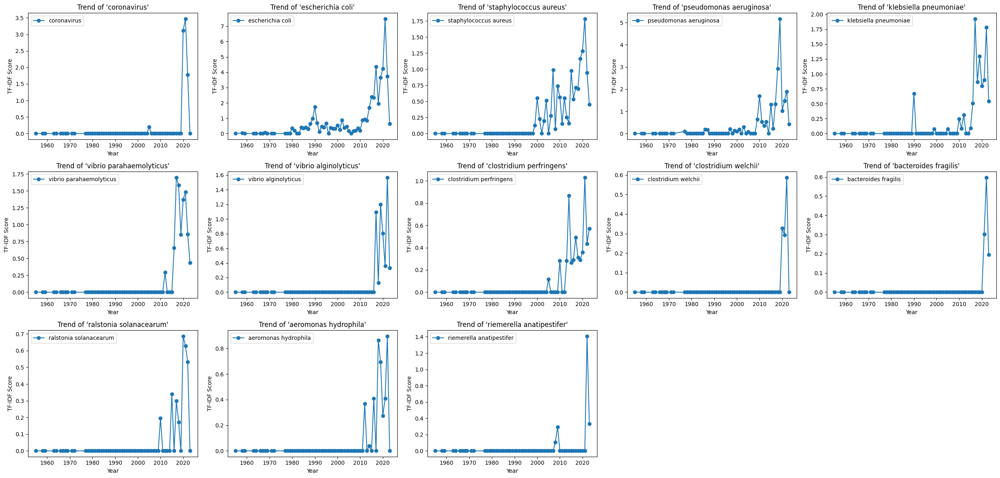

In [80]:
plot_term_trends_with_variants(data, text_columns, year_column, terms_to_study, term_variants, ngram_range, exclude_words)


In [81]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

def plot_term_trends(data, text_columns, year_column, terms_to_study, ngram_range=(1, 1),
                     exclude_words=[]):
    """
    Plots the trend of specific terms across different years.

    Args:
    data (DataFrame): Pandas DataFrame containing the data.
    text_columns (list of str): List of text column names to analyze.
    year_column (str): Column name containing the year.
    terms_to_study (list of str): Terms to study the trend of.
    ngram_range (tuple): The ngram range for TF-IDF Vectorization (default is (1, 1)).
    exclude_words (list of str): List of words to exclude from the results.

    Returns:
    None: Displays a matplotlib plot.
    """
    # Create a DataFrame to store term scores by year
    term_trends = pd.DataFrame(index=sorted(data[year_column].unique()))

    for term in terms_to_study:
        term_trends[term] = 0  # Initialize columns for each term

    for year in sorted(data[year_column].unique()):
        # Filter data for the current year
        year_data = data[data[year_column] == year]
        year_data['merged_text'] = year_data[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)

        # Apply TF-IDF vectorization
        tfidf = TfidfVectorizer(ngram_range=ngram_range, stop_words=exclude_words)
        tfidf_matrix = tfidf.fit_transform(year_data['merged_text'])

        # Get scores for terms of interest
        for term in terms_to_study:
            if term in tfidf.get_feature_names_out():
                term_index = tfidf.get_feature_names_out().tolist().index(term)
                term_score = tfidf_matrix.sum(axis=0).A[0][term_index]
                term_trends.at[year, term] = term_score

    # Plotting
    num_terms = len(terms_to_study)
    num_cols = min(5, num_terms)
    num_rows = max(1, (num_terms + num_cols - 1) // num_cols)  # Ceiling division

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
    axes = axes.flatten() if num_terms > 1 else [axes]

    for idx, term in enumerate(terms_to_study):
        ax = axes[idx] if num_terms > 1 else axes
        ax.plot(term_trends.index, term_trends[term], marker='o', label=term)
        ax.set_title(f"Trend of '{term}'")
        ax.set_xlabel('Year')
        ax.set_ylabel('TF-IDF Score')
        ax.legend()

    # Hide unused subplots
    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


In [82]:
# microorganisms
microorganisms = ['escherichia coli','staphylococcus aureus', 'pseudomonas aeruginosa','vibrio parahaemolyticus','vibrio alginolyticus',
'clostridium perfringens','klebsiella pneumoniae','pathogenic escherichia','salmonella bacteriophage','coli bacteriophage','salmonella typhimurium']

# diseases
'bacterial infection', 'infectious disease','','','','','','','','','',''

# technologies
'preparation method', 'amino acid','phage display','amino acid','monoclonal antibody','','','','','','',''

('preparation method',
 'amino acid',
 'phage display',
 'amino acid',
 'monoclonal antibody',
 '',
 '',
 '',
 '',
 '',
 '',
 '')

<ipython-input-81-099ebe2dd489>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['merged_text'] = year_data[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['10', 'according', 'agent', 'amount', 'and', 'application', 'art', 'bacteriophage', 'belongs', 'cent', 'claim', 'cleaning', 'composition', 'comprises', 'comprising', 'consisting', 'directed', 'discloses', 'disclosure', 'disinfectant', 'effective', 'embodiment', 'field', 'group', 'herein', 'information', 'least', 'may', 'model', 'non', 'object', 'one', 'or', 'per'

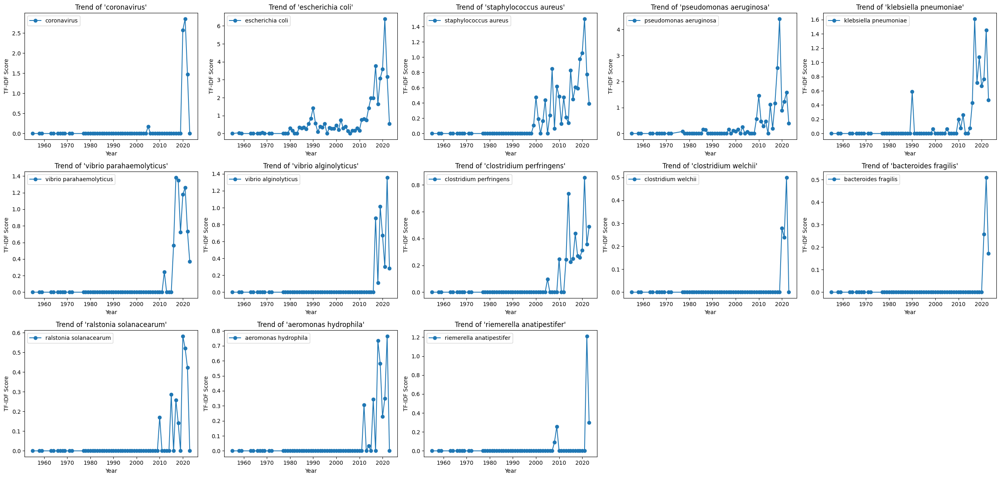

In [83]:
# Assuming 'df' is your pandas DataFrame
df = cleaned_data # Your DataFrame

# Specify the text columns to analyze
text_columns = ['cleaned_merged_column']  # Replace with your actual text column names

# Specify the year column
year_column = 'Application Year'  # Replace with your actual year column name

# Specify the terms you want to study
terms_to_study = microorganisms_2020_2024_top500  # Replace with the terms you're interested in

# Optionally, specify the ngram range and words to exclude
ngram_range = (1, 3)  # This is the default, adjust if needed
exclude_words = blacklist  # Replace with words you want to exclude

# Call the function
plot_term_trends(df, text_columns, year_column, terms_to_study, ngram_range, exclude_words=exclude_words)


## plot_term_occurrences (count)

In [84]:
import pandas as pd
import matplotlib.pyplot as plt

def preprocess_terms(data, text_columns, term_variants):
    """
    Preprocesses the data by merging term variants into a specific term.

    Args:
    data (DataFrame): Pandas DataFrame containing the data.
    text_columns (list of str or str): List of text column names or a single column name to preprocess.
    term_variants (dict): Dictionary where keys are target terms and values are lists of variants to merge.

    Returns:
    DataFrame: The preprocessed DataFrame.
    """
    if isinstance(text_columns, str):
        text_columns = [text_columns]  # Convert to list if only one column is provided

    for target_term, variants in term_variants.items():
        for variant in variants:
            for col in text_columns:
                if col in data.columns:
                    data[col] = data[col].str.replace(variant, target_term, case=False, regex=True)
    return data


def plot_term_occurrences(data, text_columns, year_column, terms_to_study, term_variants):
    """
    Plots the occurrence of specific terms in patents/documents across different years, after merging term variants.

    Args:
    data (DataFrame): Pandas DataFrame containing the data.
    text_columns (list of str or str): List of text column names or a single column name to analyze.
    year_column (str): Column name containing the year.
    terms_to_study (list of str): Terms to study the occurrence of.
    term_variants (dict): Dictionary with terms and their variants for preprocessing.

    Returns:
    None: Displays a matplotlib plot.
    """
    # Preprocess terms
    data = preprocess_terms(data, text_columns, term_variants)

    # Create a DataFrame to store term occurrence by year
    term_occurrences = pd.DataFrame(index=sorted(data[year_column].unique()))

    for term in terms_to_study:
        term_occurrences[term] = 0  # Initialize columns for each term

    for year in sorted(data[year_column].unique()):
        # Filter data for the current year
        year_data = data[data[year_column] == year]

        # Count occurrences for each term
        for term in terms_to_study:
            term_count = year_data[text_columns].apply(lambda x: x.str.contains(term, case=False, na=False)).any(axis=1).sum()
            term_occurrences.at[year, term] = term_count

    # Plotting
    num_terms = len(terms_to_study)
    num_cols = min(5, num_terms)
    num_rows = max(1, (num_terms + num_cols - 1) // num_cols)  # Ceiling division

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
    axes = axes.flatten() if num_terms > 1 else [axes]

    for idx, term in enumerate(terms_to_study):
        ax = axes[idx] if num_terms > 1 else axes
        ax.plot(term_occurrences.index, term_occurrences[term], marker='o', label=term)
        ax.set_title(f"Occurrences of '{term}'")
        ax.set_xlabel('Year')
        ax.set_ylabel('Number of Documents')
        ax.legend()

    # Hide unused subplots
    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


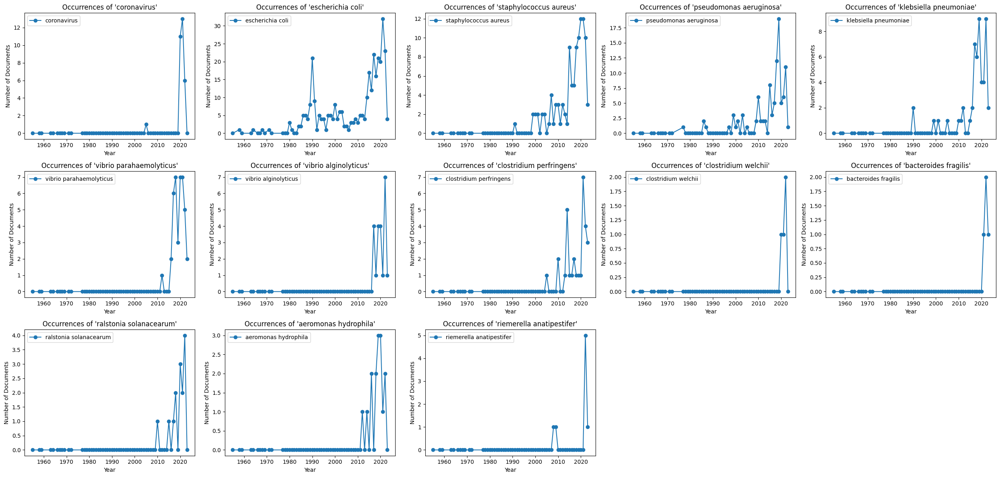

In [85]:
# Assuming 'df' is your pandas DataFrame
df = cleaned_data # Your DataFrame

# Specify the text columns to analyze
text_columns = ['cleaned_merged_column']  # Replace with your actual text column names

# Specify the year column
year_column = 'Application Year'  # Replace with your actual year column name

# Specify the terms you want to study
terms_to_study = microorganisms_2020_2024_top500  # Replace with the terms you're interested in

# Term variants
term_variants = term_variants_microorganisms_2020_2024_top500

# Call the function
plot_term_occurrences(df, text_columns, year_column, terms_to_study, term_variants)


## plot_term_occurrences_by_region

In [86]:
import matplotlib.pyplot as plt
import pandas as pd

def preprocess_terms(data, text_columns, term_variants):
    """
    Preprocesses the data by merging term variants into a specific term.
    """
    if isinstance(text_columns, str):
        text_columns = [text_columns]

    for target_term, variants in term_variants.items():
        for variant in variants:
            for col in text_columns:
                if col in data.columns:
                    data[col] = data[col].astype(str).str.replace(variant, target_term, case=False, regex=True)
    return data

def plot_term_occurrences_by_region(data, text_columns, year_column, region_column, terms_to_study, term_variants, regions_to_compare):
    """
    Plots the occurrence of specific terms in patents/documents across different years and regions in a single graph with subplots.
    """
    # Preprocess terms
    data = preprocess_terms(data, text_columns, term_variants)

    num_terms = len(terms_to_study)
    num_cols = min(5, num_terms)
    num_rows = max(1, (num_terms + num_cols - 1) // num_cols)  # Ceiling division for rows

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 6, num_rows * 4))
    axes = axes.flatten() if num_terms > 1 else [axes]

    for idx, term in enumerate(terms_to_study):
        ax = axes[idx] if num_terms > 1 else axes

        for region in regions_to_compare:
            # Filter data for the current region
            region_data = data[data[region_column] == region]

            # Count occurrences for each year
            term_occurrences = region_data.groupby(year_column).apply(
                lambda x: x[text_columns].apply(lambda y: y.str.contains(term, case=False, na=False)).any(axis=1).sum()
            )

            if not term_occurrences.empty:
                ax.plot(term_occurrences.index, term_occurrences.values, marker='o', label=region)

        ax.set_title(f"Occurrences of '{term}' by Region")
        ax.set_xlabel('Year')
        ax.set_ylabel('Number of Documents')
        ax.legend()

    # Hide unused subplots
    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
#plot_term_occurrences_by_region(data, text_columns, year_column, region_column, terms_to_study, term_variants, regions_to_compare)


In [87]:
data = cleaned_data
# Define your parameters based on the correct column names
text_columns = ['cleaned_merged_column']  # The text column name
year_column = 'Application Year'  # The year column name
region_column = 'Jurisdiction_Region'  # The region column name
terms_to_study = microorganisms_2020_2024_top500  # Replace with the terms you're interested in

# Term variants
term_variants = term_variants_microorganisms_2020_2024_top500
regions_to_compare = list(data['Jurisdiction_Region'].unique()) #['Eastern Europe', 'Asia', 'Oceania', 'North America', 'Western Europe', 'Eurasia']  # Replace with the regions you want to compare


In [88]:
data = cleaned_data
# Define your parameters based on the correct column names
text_columns = ['cleaned_merged_column']  # The text column name
year_column = 'Application Year'  # The year column name
region_column = 'Jurisdiction_Region'  # The region column name
terms_to_study = microorganisms_2020_2024_top500  # Replace with the terms you're interested in

# Term variants
term_variants = term_variants_microorganisms_2020_2024_top500
regions_to_compare = list(data['Jurisdiction_Region'].unique()) #['Eastern Europe', 'Asia', 'Oceania', 'North America', 'Western Europe', 'Eurasia']  # Replace with the regions you want to compare


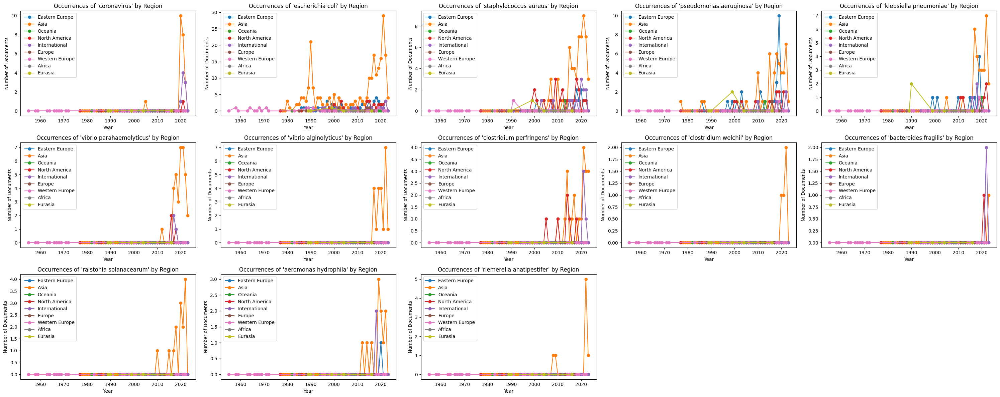

In [89]:
plot_term_occurrences_by_region(data, text_columns, year_column, region_column, terms_to_study, term_variants, regions_to_compare)


In [90]:
#plot_term_occurrences_by_region(data, text_columns, year_column, region_column, terms_to_study, term_variants, regions_to_compare)


In [91]:
def plot_term_occurrences_by_region(data, text_columns, year_column, region_column, terms_to_study, term_variants, regions_to_compare):
    """
    Plots the occurrence of specific terms in patents/documents across different years and regions.
    """
    # Preprocess terms
    data = preprocess_terms(data, text_columns, term_variants)

    for term in terms_to_study:
        fig, ax = plt.subplots(figsize=(10, 6))

        for region in regions_to_compare:
            # Verify that the region exists in the data
            if region not in data[region_column].unique():
                print(f"Region '{region}' not found in the data.")
                continue

            # Filter data for the current region
            region_data = data[data[region_column] == region]

            # Verify data is not empty after filtering
            if region_data.empty:
                print(f"No data available for region '{region}'.")
                continue

            # Count occurrences for each year
            term_occurrences = region_data.groupby(year_column).apply(
                lambda x: x[text_columns].apply(lambda y: y.str.contains(term, case=False, na=False)).any(axis=1).sum()
            )

            # Plot if term occurrences are not empty
            if not term_occurrences.empty:
                ax.plot(term_occurrences.index, term_occurrences.values, marker='o', label=region)

        ax.set_title(f"Occurrences of '{term}' by Region")
        ax.set_xlabel('Year')
        ax.set_ylabel('Number of Documents')
        ax.legend()
        plt.show()

# Call the function with your parameters




```
data = cleaned_data
# Define your parameters based on the correct column names
text_columns = ['cleaned_merged_column']  # The text column name
year_column = 'Application Year'  # The year column name
region_column = 'Jurisdiction_Region'  # The region column name
terms_to_study = microorganisms_2020_2024_top500  # Replace with the terms you're interested in

# Term variants
term_variants = term_variants_microorganisms_2020_2024_top500
regions_to_compare = list(data['Jurisdiction_Region'].unique()) #['Eastern Europe', 'Asia', 'Oceania', 'North America', 'Western Europe', 'Eurasia']  # Replace with the regions you want to compare

# Call the function with the correct column names
plot_term_occurrences_by_region(data, text_columns, year_column, region_column, terms_to_study, term_variants, regions_to_compare)

```



## plot_tfidf_occurrences_by_region



```
This approach involves calculating the TF-IDF score for each term in each region per year. Then, similar to the previous approach, we'll plot these scores on a graph with subplots for each term, allowing for a comparison of trends across regions.

The steps are as follows:

    Preprocess the text by merging term variants.
    For each term and year, calculate the TF-IDF score for each region.
    Plot the TF-IDF scores in subplots, one for each term, showing the trend across different regions.
    
# Ce texte est au format code
```





```
Interpreting the results from the TF-IDF trend analysis across different regions involves understanding what TF-IDF scores represent and how they relate to the significance of terms in specific contexts. Here’s a guide to interpreting these results:

1. **Understanding TF-IDF Scores**:
   - **High TF-IDF Score**: A high score for a term in a given region and year suggests that the term is both frequent in documents from that region and year and relatively unique across the entire dataset. It implies the term is particularly relevant or important in that context.
   - **Low TF-IDF Score**: A low score indicates that the term is either infrequent in the documents from that region and year or it is a common term across all documents in the dataset.

2. **Trend Analysis**:
   - **Rising Trend**: If the TF-IDF score of a term increases over the years in a particular region, it suggests that the term is becoming more important or relevant in that region's context.
   - **Declining Trend**: A decreasing trend in TF-IDF scores over the years might indicate that the term is losing relevance or becoming less unique in the context of that region.

3. **Regional Comparison**:
   - **Variation Across Regions**: Differences in trends or levels of TF-IDF scores across regions can indicate regional differences in focus, interest, or development related to the term. For instance, a technology term might be trending in one region due to technological advancements and less in another where it's not a focus.
   - **Uniform Trends**: Similar trends across regions might suggest a global or widespread significance of the term during certain periods.

4. **Impact of Term Variants**: By merging term variants (e.g., "AI", "artificial intelligence") before analysis, you can more accurately gauge the overall trend of a concept rather than a specific phrasing.

5. **Storytelling and Contextual Interpretation**:
   - Consider the broader context: technological, economic, political, or social factors that might influence the prominence of certain terms.
   - For example, if a medical term shows a rising trend, it could be due to increased research focus, a public health issue, or technological advancements in that medical field.

6. **Caveats and Considerations**:
   - TF-IDF is a quantitative metric and should be interpreted in conjunction with qualitative assessments.
   - The absence of a term or a low TF-IDF score doesn’t necessarily imply insignificance, as it could be due to different terminology usage or it being overshadowed by other dominant terms.

7. **Analyzing Non-Trending Terms**: If certain expected terms don’t show significant trends, it might be worth exploring alternate terminologies or investigating the dataset's representativeness.

By analyzing these trends, you can gain insights into the evolving importance and focus areas across different regions over time. This can be particularly valuable for understanding regional trends in research, technology, public interest, and other domains.
```



In [92]:
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import pandas as pd

def preprocess_terms(data, text_columns, term_variants):
    """
    Preprocesses the data by merging term variants into a specific term.
    """
    if isinstance(text_columns, str):
        text_columns = [text_columns]

    for target_term, variants in term_variants.items():
        for variant in variants:
            for col in text_columns:
                if col in data.columns:
                    data[col] = data[col].astype(str).str.replace(variant, target_term, case=False, regex=True)
    return data

def plot_tfidf_occurrences_by_region(data, text_columns, year_column, region_column, terms_to_study, ngram_range, exclude_words, term_variants, regions_to_compare):
    """
    Plots the TF-IDF occurrences of specific terms in patents/documents across different years and regions in a single graph with subplots.
    """
    # Preprocess terms
    data = preprocess_terms(data, text_columns, term_variants)

    num_terms = len(terms_to_study)
    num_cols = min(5, num_terms)
    num_rows = max(1, (num_terms + num_cols - 1) // num_cols)  # Ceiling division for rows

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 6, num_rows * 4))
    axes = axes.flatten() if num_terms > 1 else [axes]

    for idx, term in enumerate(terms_to_study):
        ax = axes[idx] if num_terms > 1 else axes

        for region in regions_to_compare:
            # Filter data for the current region
            region_data = data[data[region_column] == region]

            # Group by year
            grouped_data = region_data.groupby(year_column)

            # Initialize a list to store the average TF-IDF score for each year
            avg_tfidf_scores = []

            for year, group in grouped_data:
                # Merge text columns for TF-IDF analysis
                merged_text = group[text_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)

                # Apply TF-IDF vectorization
                tfidf = TfidfVectorizer(ngram_range=ngram_range, stop_words=exclude_words)
                tfidf_matrix = tfidf.fit_transform(merged_text)

                # Check if the term is in the feature names
                if term in tfidf.get_feature_names_out():
                    term_index = tfidf.get_feature_names_out().tolist().index(term)
                    term_tfidf_scores = tfidf_matrix[:, term_index].toarray().flatten()

                    # Calculate the average TF-IDF score for the term in this year
                    avg_score = term_tfidf_scores.mean()
                else:
                    avg_score = 0

                avg_tfidf_scores.append(avg_score)

            ax.plot(grouped_data.indices.keys(), avg_tfidf_scores, marker='o', label=region)

        ax.set_title(f"TF-IDF of '{term}' by Region")
        ax.set_xlabel('Year')
        ax.set_ylabel('Average TF-IDF Score')
        ax.legend()

    # Hide unused subplots
    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()



In [93]:
# Example usage
data = cleaned_data # Your DataFrame
text_columns = ['cleaned_merged_column']  # The text column name
year_column = 'Application Year'  # The year column name
region_column = 'Jurisdiction_Region'  # The region column name
terms_to_study = microorganisms_2020_2024_top500  # Terms you want to study
ngram_range = (1, 2)
exclude_words = blacklist  # Words to exclude
#term_variants = {'term1': ['variant1'], 'term2': ['variant2']}
regions_to_compare = ['Eastern Europe', 'Asia', 'Oceania', 'North America', 'Western Europe', 'Eurasia']

#plot_tfidf_occurrences_by_region(data, text_columns, year_column, region_column, terms_to_study, ngram_range, exclude_words, term_variants, regions_to_compare)


# old

```
## Ce texte est au format code
```



In [94]:
# Keyword Extraction using Frequency Count
def get_top_n_words(corpus, n=50):
    vec = CountVectorizer(ngram_range=(1, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

top_keywords = get_top_n_words(data['processed_title_abstract'], 50)

# Display top keywords
for word, freq in top_keywords:
    print(word, freq)

KeyError: ignored

In [ ]:
# WordCloud Visualization
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(top_keywords))
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [ ]:
# Keyword Extraction using TF-IDF
def get_top_n_words_tfidf(corpus, n=50):
    vec = TfidfVectorizer(ngram_range=(1, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

top_keywords_tfidf = get_top_n_words_tfidf(data['processed_title_abstract'], 50)

# Display top keywords from TF-IDF
for word, freq in top_keywords_tfidf:
    print(word, freq)


In [ ]:
# Bigrams

In [ ]:
# Keyword Extraction using Frequency Count for Bigrams
def get_top_n_bigrams(corpus, n=20):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)  # Only bigrams
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

top_bigrams = get_top_n_bigrams(data['processed_title_abstract'], 20)

# Display top bigrams
for word, freq in top_bigrams:
    print(word, freq)

In [ ]:
# Keyword Extraction using TF-IDF for Bigrams
def get_top_n_bigrams_tfidf(corpus, n=20):
    vec = TfidfVectorizer(ngram_range=(2, 2)).fit(corpus)  # Only bigrams
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

top_bigrams_tfidf = get_top_n_bigrams_tfidf(data['processed_title_abstract'], 20)

# Display top bigrams from TF-IDF
for word, freq in top_bigrams_tfidf:
    print(word, freq)

In [ ]:
# Function to extract top n keywords from a corpus using frequency count
def get_top_n_words(corpus, n=10):
    vec = CountVectorizer(ngram_range=(1, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# Determine the min and max application years
min_year = data['Application Year'].min()
max_year = data['Application Year'].max()

# For each 5-year interval, extract the top 10 keywords
for start_year in range(min_year, max_year, 5):
    end_year = start_year + 4
    subset = data[(data['Application Year'] >= start_year) & (data['Application Year'] <= end_year)]
    top_keywords = get_top_n_words(subset['processed_title_abstract'], 10)
    print(f"Top 10 keywords for {start_year}-{end_year}:")
    for word, freq in top_keywords:
        print(word, freq)
    print("\n")

In [ ]:
# Function to extract top n bigrams from a corpus using frequency count
def get_top_n_bigrams(corpus, n=10):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)  # Set ngram_range to (2, 2) for bigrams
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# Determine the min and max application years
min_year = data['Application Year'].min()
max_year = data['Application Year'].max()

# For each 5-year interval, extract the top 10 bigrams
for start_year in range(min_year, max_year, 5):
    end_year = start_year + 4
    subset = data[(data['Application Year'] >= start_year) & (data['Application Year'] <= end_year)]
    top_bigrams = get_top_n_bigrams(subset['processed_title_abstract'], 10)
    print(f"Top 10 bigrams for {start_year}-{end_year}:")
    for word, freq in top_bigrams:
        print(word, freq)
    print("\n")

In [ ]:
# Blacklist of generic and non-useful keywords/bigrams
blacklist = ["prior art", "object invention", "disclosed herein", "present invention", "embodiment invention","invention discloses","invention relates",
             "thereof invention","bacteriophage bacteriophage","relates bacteriophage","comprising bacteriophage","bacteriophage present",
             "invention provides","and or","invention relates","claim wherein","non non","per cent","may used","information related",
             "according claim","method claim", "wherein said","least one","according claim","method claim", "wherein said","least one","least 10","sp sp",
             "purpose obtain","problem solved","solved obtain","effective amount","invention also","10 per","least per"
             ]  # Add more terms as needed

# Function to extract top n bigrams, excluding those in the blacklist
def get_top_n_bigrams(corpus, n=10, exclude_terms=[]):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items() if word not in exclude_terms]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# Determine the min and max application years
min_year = data['Application Year'].min()
max_year = data['Application Year'].max()

# For each 5-year interval, extract the top 10 bigrams
for start_year in range(min_year, max_year, 5):
    end_year = start_year + 4
    subset = data[(data['Application Year'] >= start_year) & (data['Application Year'] <= end_year)]
    top_bigrams = get_top_n_bigrams(subset['processed_title_abstract'], 10, blacklist)
    print(f"Top 10 bigrams for {start_year}-{end_year}:")
    for word, freq in top_bigrams:
        print(word, freq)
    print("\n")

In [ ]:
# Blacklist of generic and non-useful keywords/bigrams
blacklist = ["prior art", "object invention", "disclosed herein", "present invention", "embodiment invention","invention discloses","invention relates",
             "thereof invention","bacteriophage bacteriophage","relates bacteriophage","comprising bacteriophage","bacteriophage present",
             "invention provides","and or","invention relates","claim wherein","non non","per cent","may used","information related",
             "according claim","method claim", "wherein said","least one","according claim","method claim", "wherein said","least one","least 10","sp sp",
             "purpose obtain","problem solved","solved obtain","effective amount","invention also","10 per", "also disclosed", "least per"
             ]  # Add more terms as needed

# Function to extract top n bigrams using TF-IDF, excluding those in the blacklist
def get_top_n_bigrams_tfidf(corpus, n=10, exclude_terms=[]):
    vec = TfidfVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items() if word not in exclude_terms]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# Determine the min and max application years
min_year = data['Application Year'].min()
max_year = data['Application Year'].max()

# For each 5-year interval, extract the top 10 bigrams using TF-IDF
for start_year in range(min_year, max_year, 5):
    end_year = start_year + 4
    subset = data[(data['Application Year'] >= start_year) & (data['Application Year'] <= end_year)]
    top_bigrams = get_top_n_bigrams_tfidf(subset['processed_title_abstract'], 10, blacklist)
    print(f"Top 10 bigrams for {start_year}-{end_year} based on TF-IDF:")
    for word, freq in top_bigrams:
        print(word, freq)
    print("\n")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_bigrams_by_interval(data, min_year, max_year, blacklist):
    """
    Plot top bigrams for each 5-year interval based on TF-IDF scores.

    Args:
    - data (pd.DataFrame): The data containing the 'processed_title_abstract' and 'Application Year' columns.
    - min_year (int): The starting year.
    - max_year (int): The ending year.
    - blacklist (list): List of bigrams to exclude.

    Returns:
    None
    """
    # Define a function to calculate the top bigrams using TF-IDF (assuming this function is previously defined)
    def get_top_bigrams_for_interval(data_subset, n, blacklist):
        return get_top_n_bigrams_tfidf(data_subset['processed_title_abstract'], n, blacklist)

    # Calculate top bigrams for each interval
    interval_bigrams = {
        f"{start_year}-{start_year + 4}": get_top_bigrams_for_interval(
            data[(data['Application Year'] >= start_year) & (data['Application Year'] <= start_year + 4)],
            20,
            blacklist
        )
        for start_year in range(min_year, max_year, 5)
    }

    # Plotting the top bigrams
    plt.figure(figsize=(25, 25))

    for idx, (interval, bigrams) in enumerate(interval_bigrams.items(), 1):
        bigram_names = [bigram[0] for bigram in bigrams]
        bigram_values = [bigram[1] for bigram in bigrams]

        plt.subplot(5, 4, idx)
        sns.barplot(y=bigram_names, x=bigram_values, orient='h', palette='viridis')
        plt.title(f"Top Bigrams for {interval}", fontsize=16)
        plt.xlabel('TF-IDF Score', fontsize=14)
        plt.ylabel('Bigrams', fontsize=14)
        plt.yticks(fontsize=12)
        plt.xticks(fontsize=12)
        plt.tight_layout()

    plt.suptitle('Top Bigrams by 5-Year Intervals', fontsize=18, y=1.02)
    plt.show()

# Call the function
plot_top_bigrams_by_interval(data, min_year, max_year, blacklist)


In [ ]:
# countries

### Keywords analysis and Jurisdiction

In [ ]:
# Blacklist of generic and non-useful keywords/bigrams
blacklist = ["prior art", "object invention", "disclosed herein", "present invention", "embodiment invention","invention discloses","invention relates",
             "thereof invention","bacteriophage bacteriophage","relates bacteriophage","comprising bacteriophage","bacteriophage present",
             "invention provides","and or","invention relates","claim wherein","non non","per cent","may used","information related",
             "according claim","method claim", "wherein said","least one","according claim","method claim", "wherein said","least one","least 10","sp sp",
             "purpose obtain","problem solved","solved obtain","effective amount","invention also","also disclosed","10 per","least per"
             ]  # Add more terms as needed

# Function to extract top n bigrams using TF-IDF, excluding those in the blacklist
def get_top_n_bigrams_tfidf(corpus, n=20, exclude_terms=[]):
    vec = TfidfVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items() if word not in exclude_terms]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# Group data by country and extract top 20 bigrams for each country
top_bigrams_by_country = {}

for country, group in data.groupby('Jurisdiction'):
    top_bigrams = get_top_n_bigrams_tfidf(group['processed_title_abstract'], 20, blacklist)
    top_bigrams_by_country[country] = top_bigrams

# Printing the results
for country, bigrams in top_bigrams_by_country.items():
    print(f"Top 20 bigrams for {country}:")
    for word, score in bigrams:
        print(f"{word}: {score:.2f}")
    print("\n")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_bigrams_by_jurisdiction(data, blacklist, jurisdiction_col='Jurisdiction'):
    """
    Plot top bigrams for each jurisdiction based on TF-IDF scores, sorted by the most frequent jurisdiction.

    Args:
    - data (pd.DataFrame): The data containing the 'processed_title_abstract' and a jurisdiction column.
    - blacklist (list): List of bigrams to exclude.
    - jurisdiction_col (str): The name of the column in `data` containing jurisdiction information.

    Returns:
    None
    """
    # Assuming the function to calculate the top bigrams using TF-IDF is previously defined
    def get_top_bigrams_for_jurisdiction(data_subset, n, blacklist):
        # This function needs to be defined or imported from the relevant module
        return get_top_n_bigrams_tfidf(data_subset['processed_title_abstract'], n, blacklist)

    # Sorting jurisdictions by frequency
    sorted_jurisdictions = data[jurisdiction_col].value_counts().index.tolist()

    # Calculate top bigrams for each jurisdiction
    jurisdiction_bigrams = {
        jurisdiction: get_top_bigrams_for_jurisdiction(data[data[jurisdiction_col] == jurisdiction], 20, blacklist)
        for jurisdiction in sorted_jurisdictions
    }

    # Define the figure size and subplot layout
    num_columns = 5
    num_rows = (len(sorted_jurisdictions) + num_columns - 1) // num_columns
    plt.figure(figsize=(25, 5 * num_rows))

    # Plotting the top bigrams for each jurisdiction
    for idx, (jurisdiction, bigrams) in enumerate(jurisdiction_bigrams.items(), 1):
        bigram_names = [bigram[0] for bigram in bigrams]
        bigram_values = [bigram[1] for bigram in bigrams]

        ax = plt.subplot(num_rows, num_columns, idx)
        sns.barplot(y=bigram_names, x=bigram_values, orient='h', palette='viridis', ax=ax)
        ax.set_title(f"Top Bigrams for {jurisdiction}", fontsize=16)
        ax.set_xlabel('TF-IDF Score', fontsize=14)
        ax.set_ylabel('Bigrams', fontsize=14)
        ax.tick_params(labelsize=12)

    plt.tight_layout()
    plt.suptitle('Top Bigrams by Jurisdiction', fontsize=18, y=1.02)
    plt.show()

# Call the function with the jurisdiction column name if it's different than 'Jurisdiction'
# plot_top_bigrams_by_jurisdiction(data, blacklist, 'YourJurisdictionColumnName')


In [ ]:
plot_top_bigrams_by_jurisdiction(data, blacklist, 'Jurisdiction_name')

In [ ]:
plot_top_bigrams_by_jurisdiction(data, blacklist, 'Jurisdiction_Region')

In [ ]:
data.columns

### Keywords analysis  and Legal Status

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_bigrams_by_interval(data, blacklist):
    """
    Plot top bigrams for each year interval based on TF-IDF scores, sorted by the most frequent year range.

    Args:
    - data (pd.DataFrame): The data containing the 'processed_title_abstract' and 'year_range' columns.
    - blacklist (list): List of bigrams to exclude.

    Returns:
    None
    """
    # Assuming the function to calculate the top bigrams using TF-IDF is previously defined
    def get_top_bigrams_for_interval(data_subset, n, blacklist):
        return get_top_n_bigrams_tfidf(data_subset['processed_title_abstract'], n, blacklist)

    # Sorting year intervals by frequency
    sorted_intervals = data['Legal Status'].value_counts().index.tolist()

    # Calculate top bigrams for each interval
    interval_bigrams = {
        interval: get_top_bigrams_for_interval(data[data['Legal Status'] == interval], 20, blacklist)
        for interval in sorted_intervals
    }

    # Plotting the top bigrams
    plt.figure(figsize=(25, 25))

    for idx, (interval, bigrams) in enumerate(interval_bigrams.items(), 1):
        bigram_names = [bigram[0] for bigram in bigrams]
        bigram_values = [bigram[1] for bigram in bigrams]

        plt.subplot(5, 4, idx)  # adjust as per the number of unique intervals
        sns.barplot(y=bigram_names, x=bigram_values, orient='h', palette='viridis')
        plt.title(f"Top Bigrams for {interval}", fontsize=16)
        plt.xlabel('TF-IDF Score', fontsize=14)
        plt.ylabel('Bigrams', fontsize=14)
        plt.yticks(fontsize=12)
        plt.xticks(fontsize=12)
        plt.tight_layout()

    plt.suptitle('Top Bigrams by Legal Status', fontsize=18, y=1.02)
    plt.show()

# Call the function
plot_top_bigrams_by_interval(data, blacklist)


### Topic Modeling and Keywords analysis

import matplotlib.pyplot as plt

def plot_topic_evolution(data, save_path=None):
    """
    Plot the evolution of topics over time.

    Args:
    - data (pd.DataFrame): The data containing 'Application Year' and 'Topic N°' columns.
    - save_path (str): Path to save the plots (optional).

    Returns:
    None
    """

    # Group data by 'Application Year' and 'topic', then count occurrences
    topic_counts_by_year = data.groupby(['Application Year', 'Topic N°']).size().unstack(fill_value=0)

    # Calculate the total count of each topic and sort columns by total count
    total_counts = topic_counts_by_year.sum()
    sorted_columns = total_counts.sort_values(ascending=False).index
    topic_counts_by_year = topic_counts_by_year[sorted_columns]

    # Remove the 'Total' row if it exists (for clean plotting)
    topic_counts_by_year = topic_counts_by_year.drop(index=['Total'], errors='ignore')

    # Define the number of topics
    n_topics = len(topic_counts_by_year.columns)

    # Calculate the number of rows needed for subplots
    n_rows = (n_topics + 4) // 5  # +4 for rounding up

    # Create subplots
    fig, axes = plt.subplots(n_rows, 5, figsize=(20, n_rows * 3.5))
    axes_flat = axes.flatten()

    # Plot topic evolution for each topic
    for i, topic in enumerate(topic_counts_by_year.columns):
        axes_flat[i].plot(topic_counts_by_year.index, topic_counts_by_year[topic])
        axes_flat[i].set_title(f'Topic {topic}', fontsize=14)
        axes_flat[i].set_xlabel('Year', fontsize=12)
        axes_flat[i].set_ylabel('Frequency', fontsize=12)
        axes_flat[i].grid(True, which='both', linestyle='--', linewidth=0.5)

    # Remove extra subplots
    for i in range(n_topics, len(axes_flat)):
        fig.delaxes(axes_flat[i])

    # Formatting and display
    fig.suptitle('Evolution Curve for Each Topic', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for the main title

    # Optionally save the figure
    if save_path:
        plt.savefig(save_path, dpi=600)

    # Display the plots
    plt.show()

# Call the function
plot_topic_evolution(data)


import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_bigrams_by_interval(data, blacklist):
    """
    Plot top bigrams for each year interval based on TF-IDF scores, sorted by the most frequent year range.

    Args:
    - data (pd.DataFrame): The data containing the 'processed_title_abstract' and 'year_range' columns.
    - blacklist (list): List of bigrams to exclude.

    Returns:
    None
    """
    # Assuming the function to calculate the top bigrams using TF-IDF is previously defined
    def get_top_bigrams_for_interval(data_subset, n, blacklist):
        return get_top_n_bigrams_tfidf(data_subset['processed_title_abstract'], n, blacklist)

    # Sorting year intervals by frequency
    sorted_intervals = data['Topic N°'].value_counts().index.tolist()

    # Calculate top bigrams for each interval
    interval_bigrams = {
        interval: get_top_bigrams_for_interval(data[data['Topic N°'] == interval], 20, blacklist)
        for interval in sorted_intervals
    }

    # Plotting the top bigrams
    plt.figure(figsize=(25, 25))

    for idx, (interval, bigrams) in enumerate(interval_bigrams.items(), 1):
        bigram_names = [bigram[0] for bigram in bigrams]
        bigram_values = [bigram[1] for bigram in bigrams]

        plt.subplot(5, 4, idx)  # adjust as per the number of unique intervals
        sns.barplot(y=bigram_names, x=bigram_values, orient='h', palette='viridis')
        plt.title(f"Top Bigrams for topic ({interval})", fontsize=16)
        plt.xlabel('TF-IDF Score', fontsize=14)
        plt.ylabel('Bigrams', fontsize=14)
        plt.yticks(fontsize=12)
        plt.xticks(fontsize=12)
        plt.tight_layout()

    plt.suptitle('Top Bigrams by Topic', fontsize=18, y=1.02)
    plt.show()

# Call the function
plot_top_bigrams_by_interval(data, blacklist)


## Categorize Patents:

    Classifications: Use the patent classification codes (like IPC or CPC codes) to determine broad categories of technologies/methods.
    These codes often give an initial sense of the technological domain of the patent.

In [ ]:
data.count()

In [ ]:
import pandas as pd

def preprocess_data(data, index_cols, explode_col):
    """
    Extract relevant data and explode IPCR classifications.

    Args:
    - data (pd.DataFrame): The input data.
    - index_cols (list): List of column names to be set as index.
    - explode_col (str): The column to be exploded.

    Returns:
    - exploded_data (pd.DataFrame): Data with the specified column exploded.
    """
    # Filter relevant columns and set index
    relevant_data = data[index_cols + [explode_col]]
    relevant_data.set_index(index_cols, inplace=True)

    # Explode the specified column into separate rows
    exploded_data = relevant_data[explode_col].str.split(';;').explode().str.strip().reset_index()

    return exploded_data

def compute_classifications_stats(exploded_data, group_col, agg_col):
    """
    Compute statistics related to classifications.

    Args:
    - exploded_data (pd.DataFrame): Data with classifications exploded.
    - group_col (str): The column to group by.
    - agg_col (str): The column to aggregate.

    Returns:
    - grouped (pd.DataFrame): Classifications with statistics.
    """
    total_classifications_count = exploded_data[group_col].count()

    # Group by the specified classifications and compute statistics
    grouped = exploded_data.groupby(group_col).agg({
        'Lens ID': 'count',
        agg_col: 'sum'
    }).reset_index()

    grouped['%'] = grouped['Lens ID'] / total_classifications_count * 100
    grouped['Average Citation Count'] = grouped[agg_col] / grouped['Lens ID']

    # Rename columns
    grouped.rename(columns={
        'Lens ID': 'count',
        agg_col: 'total_citations'
    }, inplace=True)

    return grouped




In [ ]:
# Example usage
index_columns = ['Lens ID', 'Application Year', 'Cited by Patent Count']
explode_column = 'IPCR Sections'
group_column = 'IPCR Sections'
aggregate_column = 'Cited by Patent Count'

# Preprocess data
exploded_data = preprocess_data(data, index_columns, explode_column)

# Compute statistics and display results
grouped_stats = compute_classifications_stats(exploded_data, group_column, aggregate_column)
print(f'The number of unique {explode_column} is: {exploded_data[explode_column].nunique()}')
grouped_stats

In [ ]:
# Example usage
index_columns = ['Lens ID', 'Application Year', 'Cited by Patent Count']
explode_column = 'IPCR Class'
group_column = 'IPCR Class'
aggregate_column = 'Cited by Patent Count'

# Preprocess data
exploded_data = preprocess_data(data, index_columns, explode_column)

# Compute statistics and display results
grouped_stats = compute_classifications_stats(exploded_data, group_column, aggregate_column)
print(f'The number of unique {explode_column} is: {exploded_data[explode_column].nunique()}')
grouped_stats

In [ ]:
# Example usage
index_columns = ['Lens ID', 'Application Year', 'Cited by Patent Count']
explode_column = 'IPCR Subclass'
group_column = 'IPCR Subclass'
aggregate_column = 'Cited by Patent Count'

# Preprocess data
exploded_data = preprocess_data(data, index_columns, explode_column)

# Compute statistics and display results
grouped_stats = compute_classifications_stats(exploded_data, group_column, aggregate_column)
print(f'The number of unique {explode_column} is: {exploded_data[explode_column].nunique()}')
grouped_stats

In [ ]:
# Example usage
index_columns = ['Lens ID', 'Application Year', 'Cited by Patent Count']
explode_column = 'IPCR Classifications'
group_column = 'IPCR Classifications'
aggregate_column = 'Cited by Patent Count'

# Preprocess data
exploded_data = preprocess_data(data, index_columns, explode_column)

# Compute statistics and display results
grouped_stats = compute_classifications_stats(exploded_data, group_column, aggregate_column)
print(f'The number of unique {explode_column} is: {exploded_data[explode_column].nunique()}')
grouped_stats

In [ ]:
data.info()

In [ ]:
import pandas as pd

def explode_column(data, column_name):
    """
    Explode a specified column, where each row can have multiple entries separated by ';;'.

    Args:
    - data (pd.DataFrame): DataFrame with a column containing possibly multiple entries.
    - column_name (str): The name of the column to explode.

    Returns:
    - pd.DataFrame: DataFrame with exploded column.
    """
    exploded_data = data.assign(**{column_name: data[column_name].str.split(';;')}).explode(column_name)
    exploded_data[column_name] = exploded_data[column_name].str.strip()  # remove any leading or trailing spaces
    return exploded_data

def get_top_items_for_range(data, column_name, start_year, end_year, top_n=10):
    """
    Returns the top N entries of a column for a given year range.

    Args:
    - data (pd.DataFrame): The preprocessed data with the column exploded.
    - column_name (str): The column to analyze.
    - start_year (int): The start of the year range.
    - end_year (int): The end of the year range.
    - top_n (int): The number of top entries to return.

    Returns:
    - pd.DataFrame: The top N entries for the given year range.
    """
    subset = data[(data['Application Year'] >= start_year) & (data['Application Year'] <= end_year)]
    return subset.groupby(column_name).size().reset_index(name='count').sort_values(by='count', ascending=False).head(top_n)

def get_top_items_intervals(data, column_name, intervals=5, top_n=10):
    """
    Prints the top N entries of a column for each specified year interval.

    Args:
    - data (pd.DataFrame): The data with the column to analyze.
    - column_name (str): The column to analyze.
    - intervals (int): The year interval for grouping.
    - top_n (int): The number of top entries to return for each interval.

    Returns:
    - None
    """
    exploded_data = explode_column(data, column_name)
    min_year = exploded_data['Application Year'].min()
    max_year = exploded_data['Application Year'].max()

    for start_year in range(min_year, max_year, intervals):
        end_year = start_year + intervals - 1
        top_items = get_top_items_for_range(exploded_data, column_name, start_year, end_year, top_n)

        print(f"Top {top_n} {column_name} classifications for {start_year}-{end_year}:")
        for _, row in top_items.iterrows():
            print(row[column_name], row['count'])
        print("\n")



In [ ]:
import pandas as pd

def explode_column(data, column_name):
    """
    Explode a specified column, where each row can have multiple entries separated by ';;'.
    Rows with NaN values in the specified column are dropped.

    Args:
    - data (pd.DataFrame): DataFrame with a column containing possibly multiple entries.
    - column_name (str): The name of the column to explode.

    Returns:
    - pd.DataFrame: DataFrame with exploded column.
    """
    # Drop rows with NaN values in the specified column
    data = data.dropna(subset=[column_name])

    exploded_data = data.assign(**{column_name: data[column_name].str.split(';;')}).explode(column_name)
    exploded_data[column_name] = exploded_data[column_name].str.strip()  # remove any leading or trailing spaces
    return exploded_data

def count_unique_IPCR_for_range(data, column_name, start_year, end_year):
    """
    Returns a DataFrame with all unique IPCR classifications for a given year range and their counts.

    Args:
    - data (pd.DataFrame): The preprocessed data with IPCR classifications exploded.
    - column_name (str): The name of the exploded column.
    - start_year (int): The start of the year range.
    - end_year (int): The end of the year range.

    Returns:
    - pd.DataFrame: All unique IPCR classifications for the given year range with their counts.
    """
    subset = data[(data['Application Year'] >= start_year) & (data['Application Year'] <= end_year)]
    return subset.groupby(column_name).size().reset_index(name='count').sort_values(by='count', ascending=False)

def count_unique_IPCR_intervals(data, column_name, intervals=5):
    """
    Prints all unique IPCR classifications and their counts for each 5-year interval.

    Args:
    - data (pd.DataFrame): The data with IPCR classifications.
    - column_name (str): The name of the column to be exploded and analyzed.
    - intervals (int): Interval of years to group the unique IPCR classifications.

    Returns:
    - None
    """
    exploded_data = explode_column(data, column_name)
    min_year = exploded_data['Application Year'].min()
    max_year = exploded_data['Application Year'].max()

    for start_year in range(min_year, max_year, intervals):
        end_year = start_year + intervals - 1
        unique_IPCR = count_unique_IPCR_for_range(exploded_data, column_name, start_year, end_year)

        print(f"Unique {column_name} classifications for {start_year}-{end_year}: {unique_IPCR.shape[0]}")
        for _, row in unique_IPCR.iterrows():
            print(f"{row[column_name]}: {row['count']}")
        print("\n")

# Assuming `data` is your DataFrame and the IPCR classifications column is named 'IPCR Classifications'
#column_to_explode = 'IPCR Classifications'
#count_unique_IPCR_intervals(data, column_to_explode)


In [ ]:
# Example usage
column_to_explode = 'IPCR Sections'
count_unique_IPCR_intervals(data, column_to_explode)


In [ ]:
# Example usage
column_to_explode = 'IPCR Class'
count_unique_IPCR_intervals(data, column_to_explode)


In [ ]:
# Example usage
column_to_explode = 'IPCR Subclass'
count_unique_IPCR_intervals(data, column_to_explode)


In [ ]:
# Example usage
column_to_explode = 'IPCR Classifications'
count_unique_IPCR_intervals(data, column_to_explode)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_IPCR_by_interval(data, column_name, intervals=5, top_n=10):
    """
    Plot top IPCR classifications for each year interval based on their count.

    Args:
    - data (pd.DataFrame): The data containing IPCR Classifications and Application Year.
    - column_name (str): The name of the column containing the IPCR classifications.
    - intervals (int): The year range for each interval to be considered.
    - top_n (int): The number of top IPCR classifications to display for each interval.

    Returns:
    None
    """
    # Explode the IPCR Classifications column
    exploded_data = data.assign(**{column_name: data[column_name].str.split(';;')}).explode(column_name)
    exploded_data[column_name] = exploded_data[column_name].str.strip().replace('', np.nan)  # remove any leading or trailing spaces

    # Determine the min and max application years
    min_year = int(exploded_data['Application Year'].min())
    max_year = int(exploded_data['Application Year'].max())

    # Initialize the plot
    plt.figure(figsize=(25, 15))
    plot_number = 1  # Start at the first subplot

    # Iterate through each interval
    for start_year in range(min_year, max_year + 1, intervals):
        end_year = start_year + intervals - 1
        # Filter data for the current interval
        interval_data = exploded_data[
            (exploded_data['Application Year'] >= start_year) &
            (exploded_data['Application Year'] <= end_year)
        ]
        # Get the top IPCR classifications by count
        top_IPCR_counts = interval_data[column_name].value_counts().head(top_n).replace(0,np.nan).dropna()

        # Prepare data for plotting
        IPCR_names = top_IPCR_counts.index.tolist()
        counts = top_IPCR_counts.values

        # Create subplot for the interval
        plt.subplot(5, 5, plot_number)  # Adjust the grid as necessary
        sns.barplot(y=IPCR_names, x=counts, orient='h', palette='viridis')
        plt.title(f"Top {top_n} IPCR Classifications for {start_year}-{end_year}", fontsize=16)
        plt.xlabel('Counts', fontsize=14)
        plt.ylabel('IPCR Classifications', fontsize=14)
        plt.yticks(fontsize=12)
        plt.xticks(fontsize=12)

        # Increment plot number for the next subplot
        plot_number += 1

    # Adjust the layout
    plt.tight_layout()
    plt.suptitle('Top IPCR Classifications by Year Interval', fontsize=18, y=1.02)
    plt.show()

# Assuming `data` is your DataFrame
plot_top_IPCR_by_interval(data, 'IPCR Classifications')


In [ ]:
plot_top_IPCR_by_interval(data, 'IPCR Subclass')

In [ ]:
plot_top_IPCR_by_interval(data, 'IPCR Class')

In [ ]:
plot_top_IPCR_by_interval(data, 'IPCR Sections')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_10_IPCR_by_country(data, ipcr_column, jurisdiction_column, top_n=10):
    """
    Plots the top 'n' IPCR classifications for each country in the provided data.

    Args:
    - data (pd.DataFrame): DataFrame containing jurisdiction and IPCR classifications columns.
    - ipcr_column (str): Name of the column containing the IPCR classifications.
    - jurisdiction_column (str): Name of the column containing the jurisdiction or country information.
    - top_n (int): The number of top IPCR classifications to plot for each country.

    Returns:
    None
    """
    #data = data.dropna(subset=jurisdiction_column)

    # Exploding the IPCR Classifications into individual rows
    exploded_data = data.assign(IPCR_Classifications=data[ipcr_column].str.split(';;')).explode('IPCR_Classifications').reset_index(drop=True)

    # 1. Group by Jurisdiction and IPCR Classifications
    grouped_data = exploded_data.groupby([jurisdiction_column, 'IPCR_Classifications']).size().reset_index(name='Counts').replace('', np.nan).dropna(subset='Counts')

    # Order jurisdictions by frequency
    jurisdiction_order = exploded_data[jurisdiction_column].value_counts().index.tolist()

    # 2. Extract Top N IPCR Classifications for Each Jurisdiction
    def get_top_n_IPCR(data_subset):
        return data_subset.sort_values(by='Counts', ascending=False).head(top_n).replace(0,np.nan).dropna()

    top_n_IPCR_per_jurisdiction = grouped_data.groupby(jurisdiction_column).apply(get_top_n_IPCR).reset_index(drop=True)

    # 3. Visualization
    jurisdictions = [j for j in jurisdiction_order if j in top_n_IPCR_per_jurisdiction[jurisdiction_column].unique()]

    # Define subplot grid dimensions
    num_columns = 5
    num_rows = -(-len(jurisdictions) // num_columns)  # Calculate ceiling of the division

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(25, 3 * num_rows))

    for idx, jurisdiction in enumerate(jurisdictions):
        ax = axes[idx // num_columns, idx % num_columns]
        jurisdiction_data = top_n_IPCR_per_jurisdiction[top_n_IPCR_per_jurisdiction[jurisdiction_column] == jurisdiction]
        sns.barplot(data=jurisdiction_data, y='IPCR_Classifications', x='Counts', orient='h', palette='viridis', ax=ax)
        ax.set_title(jurisdiction)
        ax.set_ylabel('')  # To reduce redundancy

    # Remove any unused subplots
    for j in range(idx + 1, num_rows * num_columns):
        if j < num_columns * num_rows:
            fig.delaxes(axes.flatten()[j])

    plt.tight_layout()
    plt.suptitle('Top ' + str(top_n) + ' IPCR Classifications by Jurisdiction', fontsize=20, y=1.02)
    plt.show()

# Example usage:
#plot_top_10_IPCR_by_country(data, 'IPCR Classifications', 'Jurisdiction')


In [ ]:
#data[]

In [ ]:
plot_top_10_IPCR_by_country(data, 'IPCR Classifications', 'Jurisdiction_name')

In [ ]:
plot_top_10_IPCR_by_country(data, 'IPCR Subclass', 'Jurisdiction_name')

In [ ]:
plot_top_10_IPCR_by_country(data, 'IPCR Class', 'Jurisdiction_name')

In [ ]:
plot_top_10_IPCR_by_country(data, 'IPCR Sections', 'Jurisdiction_name')

In [ ]:
data[['Jurisdiction', 'Jurisdiction_name', 'Jurisdiction_Region']]

In [ ]:
plot_top_10_IPCR_by_country(data, 'IPCR Sections', 'Jurisdiction_Region')

In [ ]:
plot_top_10_IPCR_by_country(data, 'IPCR Subclass', 'Jurisdiction_Region')

In [ ]:
plot_top_10_IPCR_by_country(data, 'IPCR Class', 'Jurisdiction_Region')

In [ ]:
plot_top_10_IPCR_by_country(data, 'IPCR Sections', 'Jurisdiction_Region')

## Citations Analysis:

    Forward Citations: Patents that are frequently cited by later patents often represent foundational or influential technologies/methods.
    Analyzing forward citations can help pinpoint key technologies that have spawned subsequent innovations.

In [ ]:
data_citation = data[["Lens ID","Application Number","Application Year","Title","Applicants","Legal Status","Simple Family Size","Extended Family Size","Cited by Patent Count"]]

data_citation

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import textwrap

# Sort patents based on citations
sorted_data = data_citation.sort_values(by="Cited by Patent Count", ascending=False)

# Plot the top 20 patents by citations
top_10 = sorted_data.head(20)

# Append 'Application Year' to the title, add applicant name at the end, convert to lowercase, and then wrap
top_10['Wrapped Title'] = top_10.apply(lambda row: f"({int(row['Application Year'])}) " + textwrap.fill(row['Title'].lower() + f" ({row['Applicants']})", 250), axis=1)

top_10 = top_10.sort_values(by="Cited by Patent Count", ascending=True)  # Re-sort for plotting

# Adjusting the figure's dimensions
plt.figure(figsize=(8, 8))

# Limiting the x-axis range to reduce bar length and increase whitespace
max_citations = top_10['Cited by Patent Count'].max()
plt.xlim(0, max_citations + (0.2 * max_citations))  # adding a 20% margin

sns.barplot(data=top_10, y='Wrapped Title', x='Cited by Patent Count', palette='viridis', orient='h')

plt.title('Top 20 Patents by Forward Citations', fontsize=16)
plt.xlabel('Number of Citations', fontsize=14)
plt.ylabel('Patent Title', fontsize=14)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
sns.despine(left=True, bottom=True)  # Removes the top and right spines
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import textwrap

# Determine the min and max application years
min_year = int(sorted_data['Application Year'].min())
max_year = int(sorted_data['Application Year'].max())

def plot_top_cited_for_interval(data, start_year, end_year):
    subset = data[(data['Application Year'] >= start_year) & (data['Application Year'] <= end_year)]
    top_10 = subset.sort_values(by="Cited by Patent Count", ascending=False).head(10)

    # Wrapping title with year and applicant name
    top_10['Wrapped Title'] = top_10.apply(lambda row: f"({int(row['Application Year'])}) " + textwrap.fill(row['Title'].lower() + f" ({row['Applicants']})", 200), axis=1)

    # Limiting the x-axis range to reduce bar length and increase whitespace
    max_citations = top_10['Cited by Patent Count'].max()
    xlim_val = max_citations + (0.2 * max_citations)  # adding a 20% margin

    plt.figure(figsize=(8, 4))
    sns.barplot(data=top_10, y='Wrapped Title', x='Cited by Patent Count', palette='viridis', orient='h')
    plt.xlim(0, xlim_val)
    plt.title(f"Top 10 Patents {start_year}-{end_year}", fontsize=16)
    plt.xlabel('Number of Citations', fontsize=14)
    plt.ylabel('Patent Title', fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    sns.despine(left=True, bottom=True)
    plt.tight_layout()
    plt.gca().invert_yaxis()
    plt.show()

for start in range(min_year, max_year, 5):
    plot_top_cited_for_interval(sorted_data, start, start+4)
